## Linear Regression

The comp-activ databases is a collection of a computer systems activity measures .
The data was collected from a Sun Sparcstation 20/712 with 128 Mbytes of memory running in a multi-user university department. Users would typically be doing a large variety of tasks ranging from accessing the internet, editing files or running very cpu-bound programs. 

As you are a budding data scientist you thought to find out a linear equation to build a model to predict 'usr'(Portion of time (%) that cpus run in user mode) and to find out how each attribute affects the system to be in 'usr' mode using a list of system attributes.

System measures used:

lread - Reads (transfers per second ) between system memory and user memory. 

lwrite - writes (transfers per second) between system memory and user memory. 

scall - Number of system calls of all types per second. 

sread - Number of system read calls per second . 

swrite - Number of system write calls per second . 

fork - Number of system fork calls per second.

exec - Number of system exec calls per second.

rchar - Number of characters transferred per second by system read calls.

wchar - Number of characters transfreed per second by system write calls.

pgout - Number of page out requests per second.

ppgout - Number of pages, paged out per second.

pgfree - Number of pages per second placed on the free list.

pgscan - Number of pages checked if they can be freed per second.

atch - Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second.

pgin - Number of page-in requests per second.

ppgin - Number of pages paged in per second.

pflt - Number of page faults caused by protection errors (copy-on-writes).

vflt - Number of page faults caused by address translation .

runqsz - Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.

Typically, this value should be less than 2. Consistently higher values mean that the system might be CPU-bound.)

freemem - Number of memory pages available to user processes.

freeswap - Number of disk blocks available for page swapping.

-----------------------
usr - Portion of time (%) that cpus run in user mode

#### Import Libraries

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
# for randomized data splitting 
from sklearn.model_selection import train_test_split

# To build linear regression Model 
from sklearn.linear_model import LinearRegression

# To build linear regression_model
import statsmodels.api as sm


# To check model performance 
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor

**Load data file and explore infomation**

In [2]:
df = pd.read_excel('compactiv.xlsx')

#### 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

In [3]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [5]:
df.shape

(8192, 22)

In [6]:
# Are there any missing values?
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

* Two columns rchar and wchar having missing values
* Check for duplicate data

In [7]:
# Are there any duplicates ?
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
#df[dups]

Number of duplicate rows = 0


In [8]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,19.56,53.35,0.0,2.0,7.0,20.00,1845.00
lwrite,8192.0,13.11,29.89,0.0,0.0,1.0,10.00,575.00
scall,8192.0,2306.32,1633.62,109.0,1012.0,2051.5,3317.25,12493.00
sread,8192.0,210.48,198.98,6.0,86.0,166.0,279.00,5318.00
swrite,8192.0,150.06,160.48,7.0,63.0,117.0,185.00,5456.00
fork,8192.0,1.88,2.48,0.0,0.4,0.8,2.20,20.12
exec,8192.0,2.79,5.21,0.0,0.2,1.2,2.80,59.56
rchar,8088.0,197385.73,239837.49,278.0,34091.5,125473.5,267828.75,2526649.00
wchar,8177.0,95902.99,140841.71,1498.0,22916.0,46619.0,106101.00,1801623.00
pgout,8192.0,2.29,5.31,0.0,0.0,0.0,2.40,81.44


## EDA

In [9]:
from pylab import rcParams

In [10]:
rcParams['figure.figsize'] = 10,10

lread       13.897852
lwrite       5.277645
scall        0.902531
sread        5.459466
swrite       9.605844
fork         2.249689
exec         4.069238
rchar        2.854044
wchar        3.847654
pgout        5.066984
ppgout       4.680442
pgfree       4.768191
pgscan       5.813415
atch        21.542020
pgin         3.242412
ppgin        3.902765
pflt         1.720284
vflt         1.737327
freemem      1.807555
freeswap    -0.791664
usr         -3.416750
dtype: float64

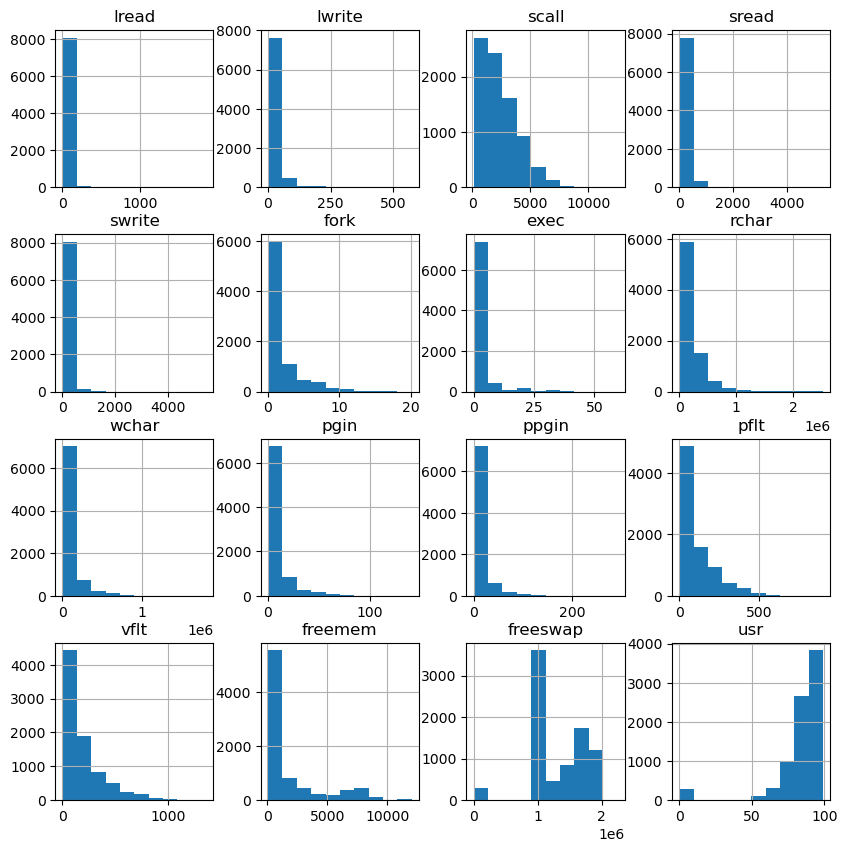

In [11]:
import warnings
warnings.filterwarnings('ignore')
df[['lread','lwrite','scall','sread','swrite','fork','exec','rchar','wchar','pgin','ppgin','pflt','vflt','freemem','freeswap','usr']].hist();
df.skew()

* Almost all the feature are right skew except dependent 'usr' variable is left skew
* Independent variable are not normal distributed

### Bivariate Analysis

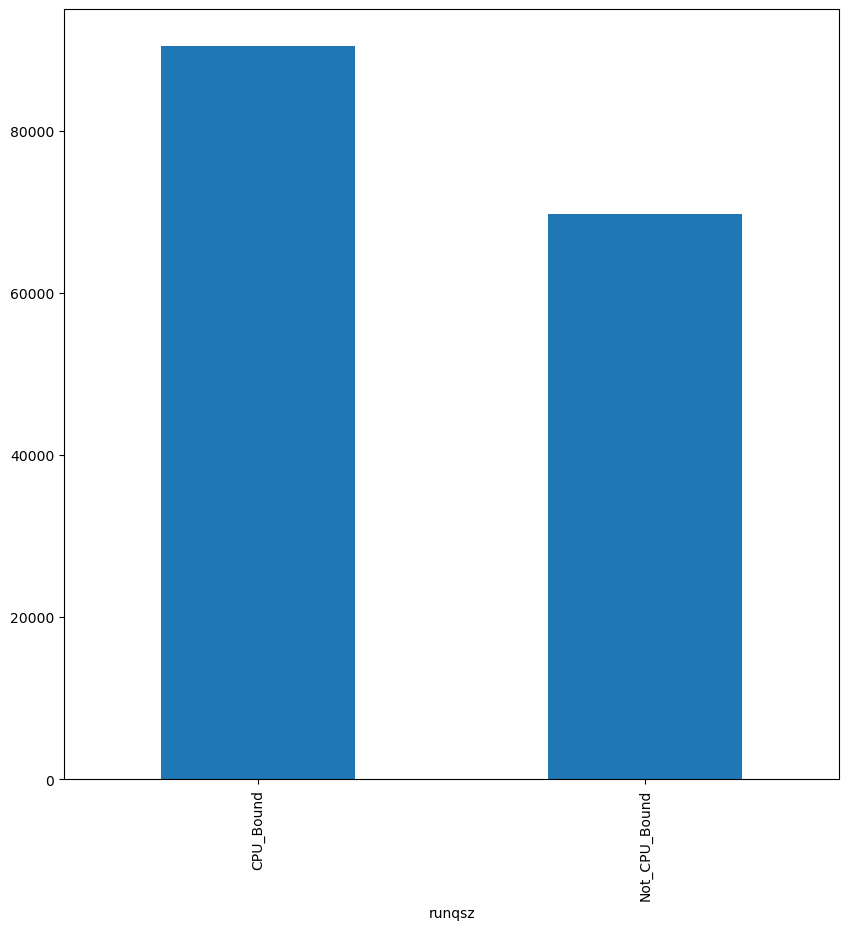

In [12]:
df.groupby('runqsz').sum()['lread'].plot(kind= 'bar');

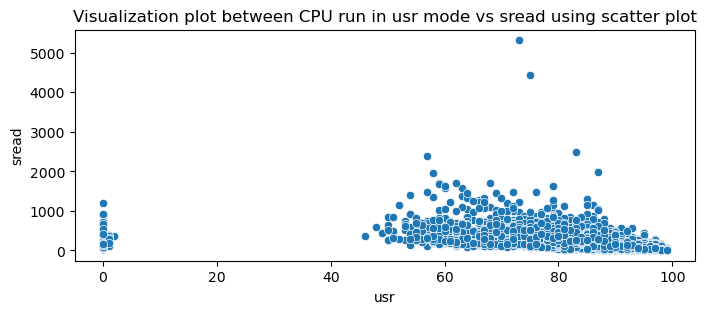

In [13]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df,x='usr',y='sread')
plt.title("Visualization plot between CPU run in usr mode vs sread using scatter plot")
plt.show()

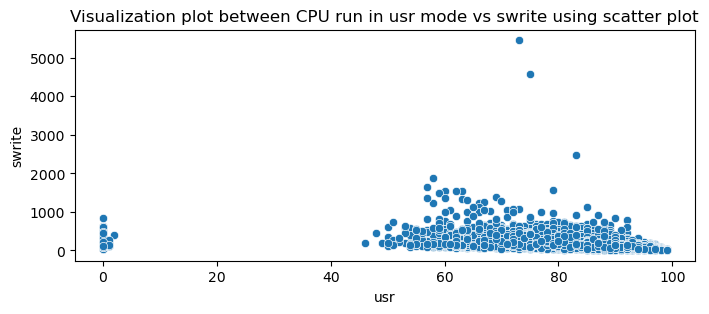

In [14]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df, x='usr',y='swrite')
plt.title("Visualization plot between CPU run in usr mode vs swrite using scatter plot")
plt.show()

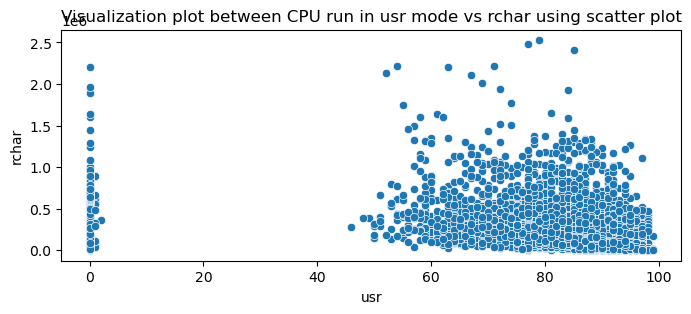

In [15]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df , x='usr', y='rchar')
plt.title("Visualization plot between CPU run in usr mode vs rchar using scatter plot")
plt.show()

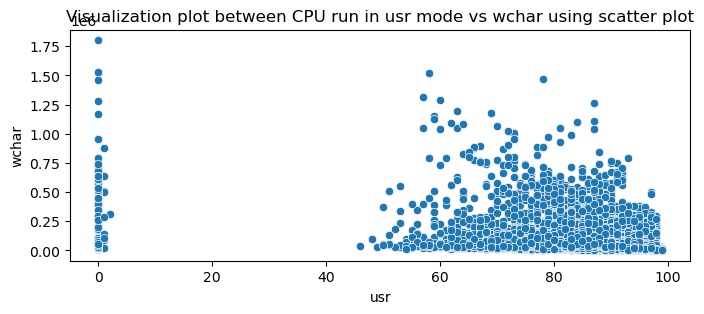

In [16]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df, x= 'usr',y= 'wchar')
plt.title("Visualization plot between CPU run in usr mode vs wchar using scatter plot") 
plt.show()

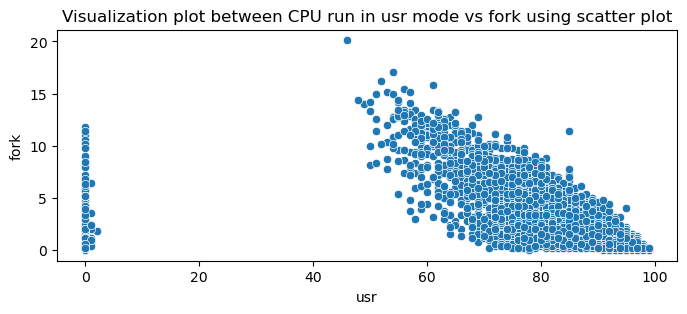

In [17]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df,x='usr',y='fork')
plt.title("Visualization plot between CPU run in usr mode vs fork using scatter plot");

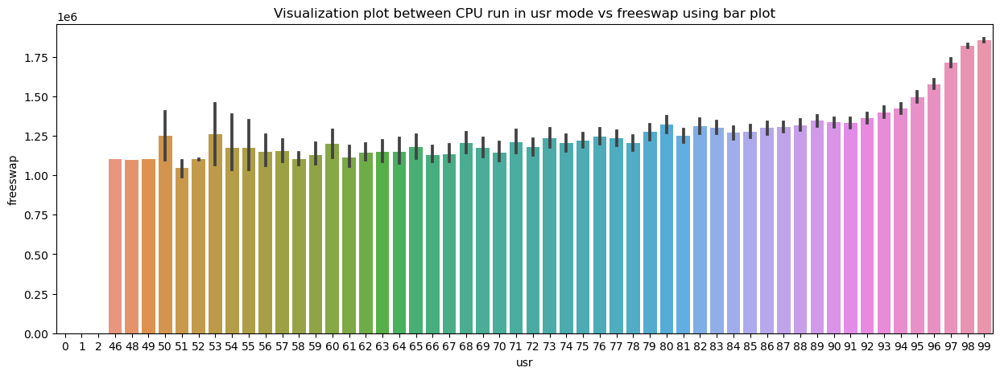

In [18]:
plt.figure(figsize=(15,5))
sns.barplot(data=df, x='usr',y='freeswap')
plt.title("Visualization plot between CPU run in usr mode vs freeswap using bar plot")
plt.show()

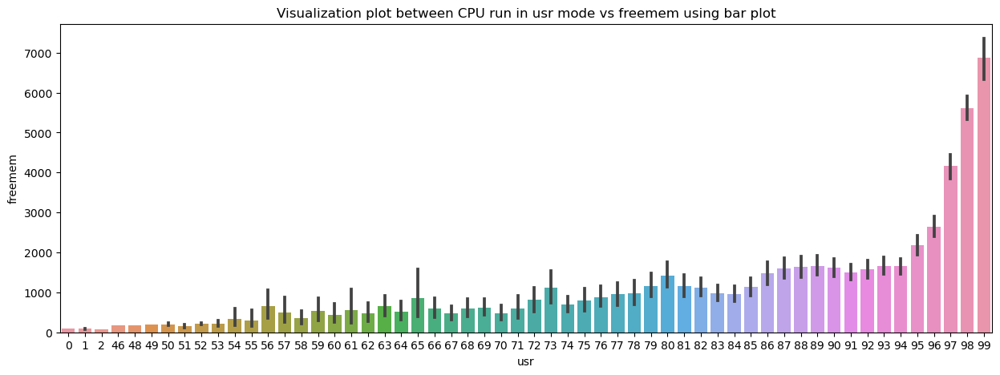

In [19]:
plt.figure(figsize=(15,5))
sns.barplot(data=df, x='usr',y='freemem')
plt.title("Visualization plot between CPU run in usr mode vs freemem using bar plot");

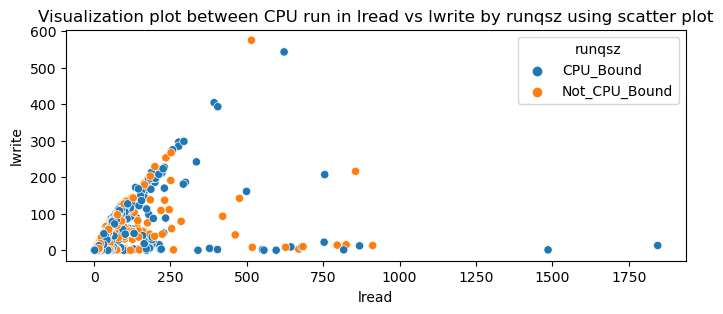

In [20]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df,x='lread',y='lwrite', hue='runqsz')
plt.title("Visualization plot between CPU run in lread vs lwrite by runqsz using scatter plot")
plt.show()

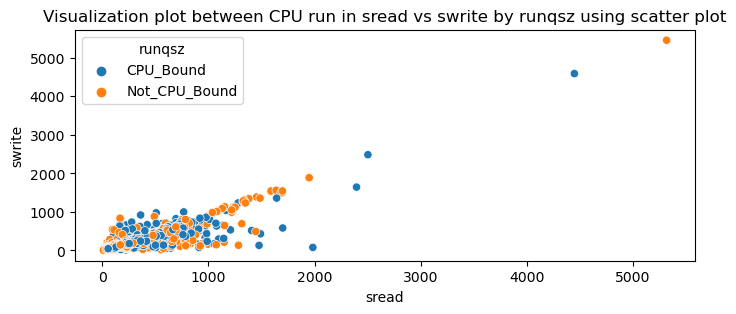

In [21]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df,x='sread',y='swrite',hue='runqsz')
plt.title("Visualization plot between CPU run in sread vs swrite by runqsz using scatter plot") 
plt.show()

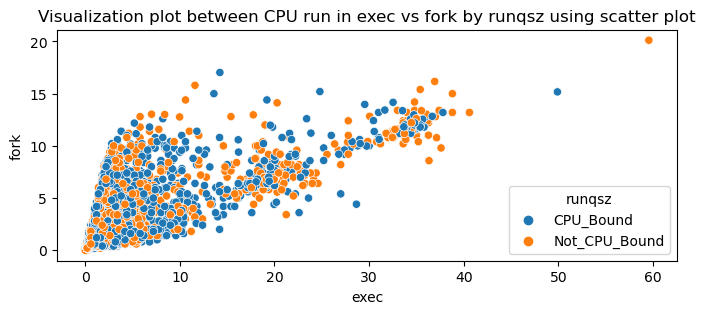

In [22]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df,x='exec',y='fork', hue='runqsz')
plt.title("Visualization plot between CPU run in exec vs fork by runqsz using scatter plot")
plt.show()

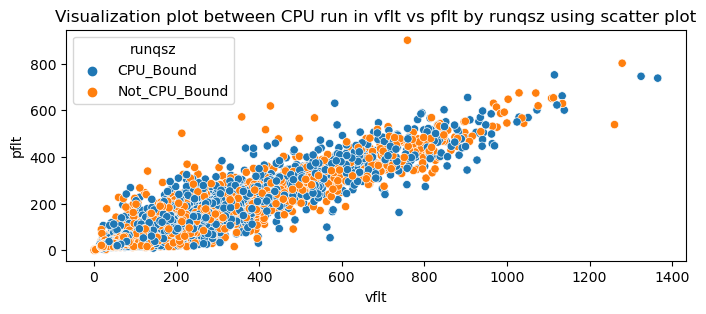

In [23]:
plt.figure(figsize=(8,3))
sns.scatterplot(data=df,x='vflt',y='pflt',hue='runqsz')
plt.title("Visualization plot between CPU run in vflt vs pflt by runqsz using scatter plot")
plt.show()

### Multivariate Analysis

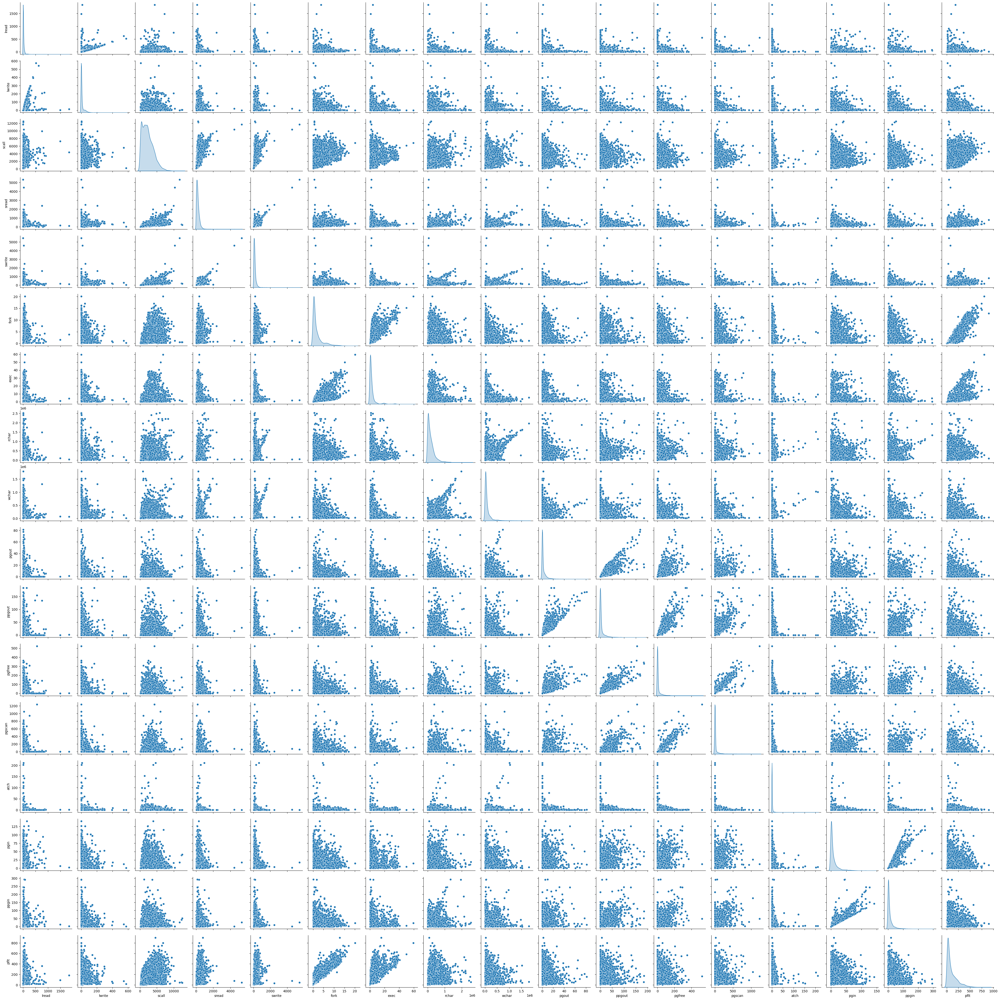

In [24]:
df_attr = df.iloc[:, 0:17]
sns.pairplot(
    df_attr, diag_kind="kde"
)  # to plot density curve instead of histogram on the diag
plt.show()

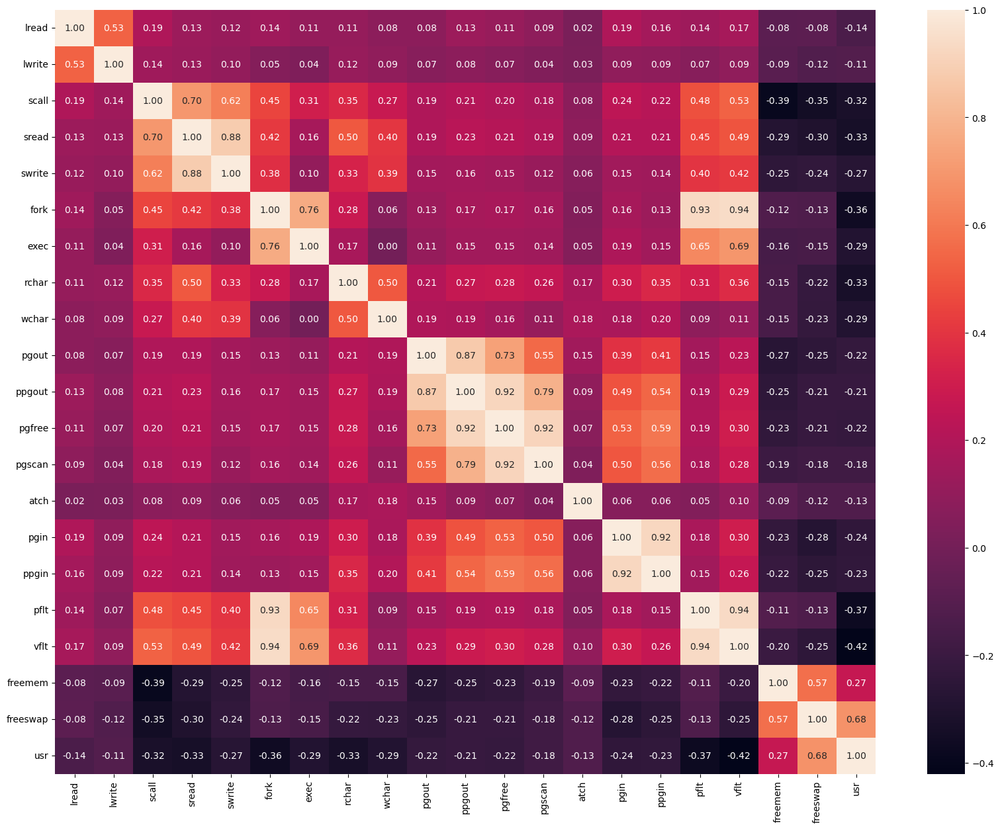

In [25]:
plt.figure(figsize=(20,15))
sns.heatmap(data=df.corr(),annot=True , fmt= '.2f');

#### 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

In [26]:
for column in df.columns:
    print('% of records value as 0 in {} : {:.2%}' .format(column,(df[df[column]==0].shape[0])/df.shape[0]))

% of records value as 0 in lread : 8.24%
% of records value as 0 in lwrite : 32.76%
% of records value as 0 in scall : 0.00%
% of records value as 0 in sread : 0.00%
% of records value as 0 in swrite : 0.00%
% of records value as 0 in fork : 0.26%
% of records value as 0 in exec : 0.26%
% of records value as 0 in rchar : 0.00%
% of records value as 0 in wchar : 0.00%
% of records value as 0 in pgout : 59.55%
% of records value as 0 in ppgout : 59.55%
% of records value as 0 in pgfree : 59.44%
% of records value as 0 in pgscan : 78.71%
% of records value as 0 in atch : 55.85%
% of records value as 0 in pgin : 14.89%
% of records value as 0 in ppgin : 14.89%
% of records value as 0 in pflt : 0.04%
% of records value as 0 in vflt : 0.00%
% of records value as 0 in runqsz : 0.00%
% of records value as 0 in freemem : 0.00%
% of records value as 0 in freeswap : 0.00%
% of records value as 0 in usr : 3.45%


* since the zero values are more than the 50% in columns pgout,ppgout,pgfree,pgscan - it is decided to drop these columns
* The remaining less than 50% of zero values are replaced by median

In [27]:
df = df.drop(['pgout','ppgout','pgfree','pgscan','atch'],axis=1)

In [28]:
df.lread.replace(to_replace=0, value=df.lread.median(),inplace=True)
df.lwrite.replace(to_replace=0,value=df.lwrite.median(),inplace=True)
df.fork.replace(to_replace=0, value=df.fork.median(), inplace=True)
df.exec.replace(to_replace=0, value=df.exec.median(), inplace=True)
df.pgin.replace(to_replace=0, value=df.pgin.median(), inplace=True)
df.ppgin.replace(to_replace=0, value=df.ppgin.median(), inplace=True)
df.pflt.replace(to_replace=0, value=df.pflt.median(), inplace=True)
df.usr.replace(to_replace=0, value=df.usr.median(), inplace=True)

In [29]:
col = ['rchar','wchar']
for column in df[col].columns:
    if df[column].dtype != 'object':
        median = df[column].median()
        df[column] = df[column].fillna(median)    
        
df.isnull().sum()        

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

In [30]:
# drop_first=True will drop one of the three origin columns
df = pd.get_dummies(df, columns=["runqsz"], drop_first=True)
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,1,2147,79,68,0.2,0.2,40671.0,53995.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,7,1,170,18,21,0.2,0.2,448.0,8385.0,2.8,3.8,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,6.0,9.4,150.20,220.20,702,1021237,87,1
3,7,1,160,12,16,0.2,0.2,125473.5,8670.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,1.0,1.2,37.80,47.60,633,1760253,90,1


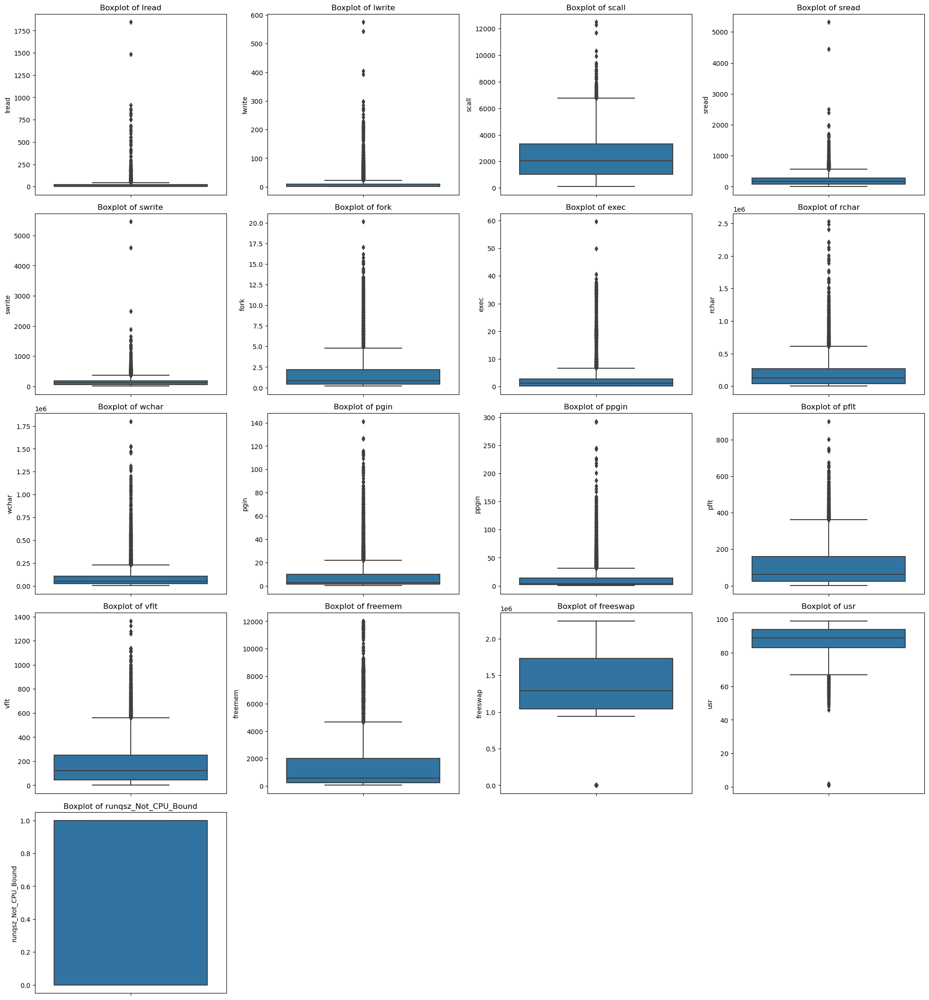

In [31]:
#Check for presence of outliers in each feature
cont=df.dtypes[(df.dtypes!='object')].index # & (df.dtypes!='')].index
plt.figure(figsize = (20,30))
feature_list = df.columns 
for i in range(len(feature_list)):
    plt.subplot(7, 4 , i + 1)
    sns.boxplot(y = df[feature_list[i]], data = df)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [32]:
def Remove_outliers(col):
    sorted(col)
    Q1, Q3 = col.quantile([0.25,0.75])
    IQR = Q3 - Q1
    lower_limit = Q1 -(1.5 * IQR)
    upper_limit = Q3 + (1.5 * IQR)
    return lower_limit,upper_limit

In [33]:
for column in df[cont].columns:
    lr,ul = Remove_outliers(df[column])
    df[column] = np.where(df[column]<lr,lr,df[column])
    df[column] = np.where(df[column]>ul,ul,df[column])

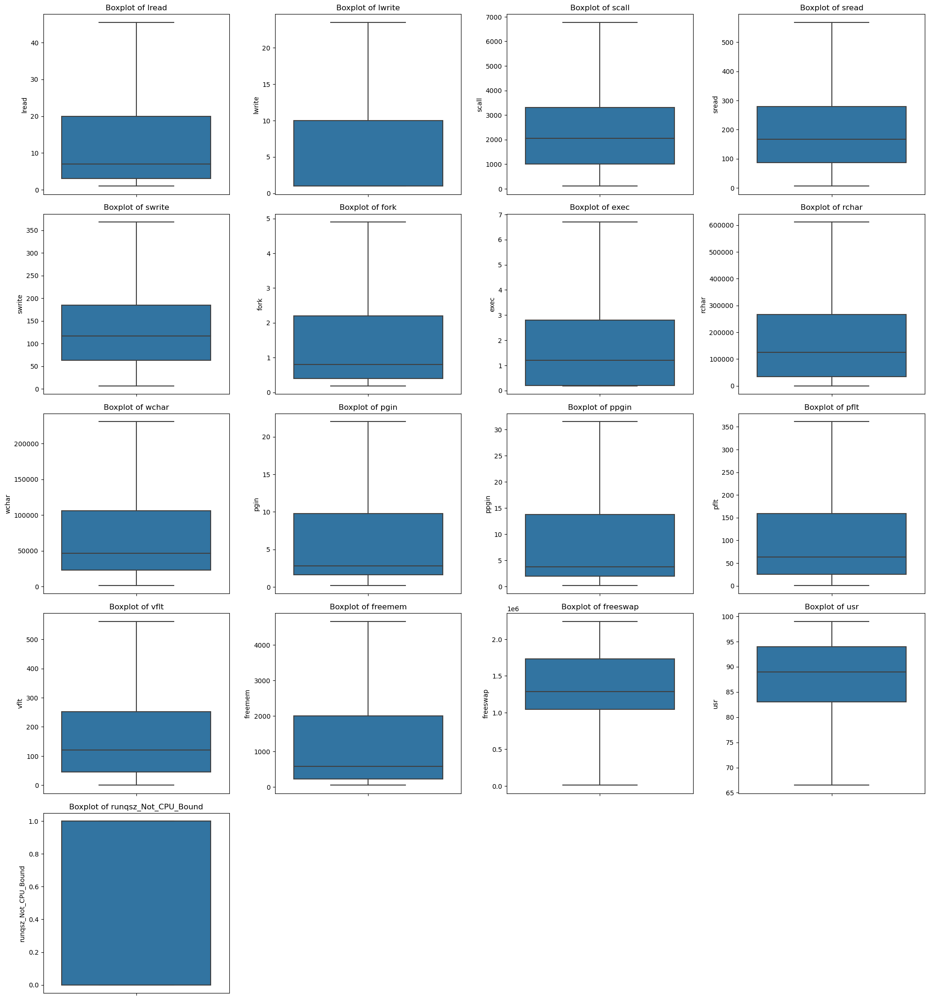

In [34]:
#Check for presence of outliers in each feature
plt.figure(figsize = (20,30))
feature_list = df.columns
for i in range(len(feature_list)):
    plt.subplot(7, 4 , i + 1)
    sns.boxplot(y = df[feature_list[i]], data = df)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

#### 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

In [35]:
# Copy all the predictor variables into X dataframe
X = df.drop('usr', axis=1)

# Copy target into the y dataframe. 
y = df[['usr']]

In [36]:
# Split X and y into training and test set in 75:25 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1)

### Linear Regression using statsmodels(OLS)


In [37]:
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

In [38]:
model = sm.OLS(y_train,X_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     2284.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        23:33:54   Log-Likelihood:                -14529.
No. Observations:                5734   AIC:                         2.909e+04
Df Residuals:                    5717   BIC:                         2.921e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  100.4287 

### How to check for Multicollinearity

* There are different ways of detecting (or testing) multicollinearity. One such way is Variation Inflation Factor.

* **Variance  Inflation  factor**:  Variance  inflation  factors  measure  the  inflation  in  the variances of the regression coefficients estimates due to collinearities that exist among the  predictors.  It  is  a  measure  of  how  much  the  variance  of  the  estimated  regression coefficient $\beta_k$ is "inflated" by  the  existence  of  correlation  among  the  predictor variables in the model.

* **General Rule of Thumb**:

    - If VIF is 1, then there is no correlation among the $k$th predictor and the remaining predictor variables, and  hence, the variance of $\beta_k$ is not inflated at all.
    - If VIF exceeds 5, we say there is moderate VIF, and if it is 10 or exceeding 10, it shows signs of high multi-collinearity.
    - The purpose of the analysis should dictate which threshold to use.

**Check Multi-collinearity using VIF**

In [39]:
vif_series = pd.Series([variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])],
                      index=X_train.columns,)

print('VIF Values: \n\n{}\n'.format(vif_series))

VIF Values: 

const                   28.736269
lread                    4.652816
lwrite                   3.892143
scall                    2.948726
sread                    6.407948
swrite                   5.593797
fork                    12.834459
exec                     3.209547
rchar                    2.111229
wchar                    1.564612
pgin                    12.770554
ppgin                   12.711527
pflt                    11.957558
vflt                    15.638402
freemem                  1.721348
freeswap                 1.822063
runqsz_Not_CPU_Bound     1.137637
dtype: float64



In [40]:
#1) Removing predictor 'vflt' as VIF>10 
X_train1 = X_train.drop(["vflt"], axis=1) 
olsmod_1 = sm.OLS(y_train, X_train1)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.859 
Adjusted R-squared: 0.859


In [41]:
vif_series = pd.Series([variance_inflation_factor(X_train1.values,i) for i in range(X_train1.shape[1])],
                      index=X_train1.columns,)

print('VIF Values: \n\n{}\n'.format(vif_series))

VIF Values: 

const                   28.261041
lread                    4.633713
lwrite                   3.890190
scall                    2.939560
sread                    6.363302
swrite                   5.592346
fork                    10.029083
exec                     3.203256
rchar                    2.098434
wchar                    1.545907
pgin                    12.608695
ppgin                   12.708254
pflt                     9.057589
freemem                  1.719311
freeswap                 1.765370
runqsz_Not_CPU_Bound     1.137383
dtype: float64



In [42]:
X_train = X_train.drop('vflt', axis=1)  

In [43]:
model1 = sm.OLS(y_train,X_train).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     2332.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        23:34:31   Log-Likelihood:                -14638.
No. Observations:                5734   AIC:                         2.931e+04
Df Residuals:                    5718   BIC:                         2.941e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  100.0158 

In [44]:
#1) Removing predictor 'ppgin' as VIF>10 
X_train2 = X_train.drop(["ppgin"], axis=1)
olsmod_2 = sm.OLS(y_train, X_train2)
olsres_2 = olsmod_2.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)


R-squared: 0.859 
Adjusted R-squared: 0.859


In [45]:
vif_series = pd.Series([variance_inflation_factor(X_train2.values,i) for i in range(X_train2.shape[1])],
                      index=X_train2.columns,)

print('VIF Values: \n\n{}\n'.format(vif_series))

VIF Values: 

const                   28.233038
lread                    4.611296
lwrite                   3.883163
scall                    2.938315
sread                    6.363264
swrite                   5.592261
fork                    10.014333
exec                     3.203191
rchar                    2.064223
wchar                    1.545889
pgin                     1.314178
pflt                     9.056722
freemem                  1.718422
freeswap                 1.763121
runqsz_Not_CPU_Bound     1.137042
dtype: float64



In [46]:
X_train = X_train.drop('ppgin',axis=1)

In [47]:
model3 = sm.OLS(y_train,X_train).fit()
print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     2491.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        23:35:32   Log-Likelihood:                -14646.
No. Observations:                5734   AIC:                         2.932e+04
Df Residuals:                    5719   BIC:                         2.942e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  100.0436 

In [48]:
#1) Removing predictor 'fork' as VIF>10 
X_train3 = X_train.drop(["fork"], axis=1) 
olsmod_3 = sm.OLS(y_train, X_train3)
olsres_3 = olsmod_3.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.859 
Adjusted R-squared: 0.858


In [49]:
vif_series = pd.Series([variance_inflation_factor(X_train3.values,i) for i in range(X_train3.shape[1])],
                      index=X_train3.columns,)

print('VIF Values: \n\n{}\n'.format(vif_series))

VIF Values: 

const                   28.064065
lread                    4.597117
lwrite                   3.868041
scall                    2.900425
sread                    6.362229
swrite                   5.384557
exec                     2.826211
rchar                    2.063525
wchar                    1.537498
pgin                     1.312851
pflt                     3.408386
freemem                  1.717564
freeswap                 1.760266
runqsz_Not_CPU_Bound     1.136592
dtype: float64



In [50]:
X_train = X_train.drop('fork',axis=1)

In [51]:
model4 = sm.OLS(y_train,X_train).fit()
print(model4.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     2674.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        23:36:22   Log-Likelihood:                -14654.
No. Observations:                5734   AIC:                         2.934e+04
Df Residuals:                    5720   BIC:                         2.943e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  100.1104 

In [52]:
#1) Removing predictor 'sread' as VIF>5 
X_train4 = X_train.drop(["sread"], axis=1)
olsmod_4 = sm.OLS(y_train, X_train4)
olsres_4 = olsmod_4.fit()
print(
    "R-squared:",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared: 0.859 
Adjusted R-squared: 0.858


In [53]:
vif_series = pd.Series([variance_inflation_factor(X_train4.values,i) for i in range(X_train4.shape[1])],
                      index=X_train4.columns,)

print('VIF Values: \n\n{}\n'.format(vif_series))

VIF Values: 

const                   27.996087
lread                    4.592035
lwrite                   3.861065
scall                    2.645732
swrite                   3.010461
exec                     2.819124
rchar                    1.651604
wchar                    1.524926
pgin                     1.312450
pflt                     3.387074
freemem                  1.717264
freeswap                 1.747711
runqsz_Not_CPU_Bound     1.136592
dtype: float64



In [56]:
X_train4 = X_train.drop('sread',axis=1)

In [58]:
model5 = sm.OLS(y_train,X_train4).fit()
print(model5.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     2897.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        23:39:40   Log-Likelihood:                -14654.
No. Observations:                5734   AIC:                         2.933e+04
Df Residuals:                    5721   BIC:                         2.942e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  100.1007 

#### After dropping the feature using strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply (Adj. R-squared has dropped from 864 to 858).  This shows that these variable did not have much predictive power.

## Assumptions of Linear Regression

These assumptions are essential conditions that should be met before we draw inferences regarding the model estimates or use the model to make a prediction.

For Linear Regressions, we need to check if the following assumptions hold:-

1. Linearity
2. Independence
3. Homoscedasticty
4. Normality of error terms
5. No strong Multicollinearity

In [67]:
df_pred = pd.DataFrame()

df_pred['Actual Values'] = y_train.values.flatten()
df_pred['Fitted Values'] =model5.fittedvalues.values
df_pred['Residuals'] = model5.resid.values 

In [60]:
df_pred.head()

,Actual Values,Fitted Values,Residuals
0,91.0,91.617405,-0.617405
1,94.0,95.396865,-1.396865
2,89.0,89.104951,-0.104951
3,83.0,84.251929,-1.251929
4,94.0,96.783094,-2.783094


## Test for Linearlity and Independence

#### Why the test?

* Linearity describes a straight-line relationship between two variables, predictor variables must have a linear relation with the dependent variable.

#### How to check Linearity?

* Make a plot of fitted values vs residuals. If they don't follow any pattern (the curve is straight line). then we say the model is linear otherwise model is showing sighs of non-linearity.

#### How to fix if this assumption is not followed?

* We can try different transformations.

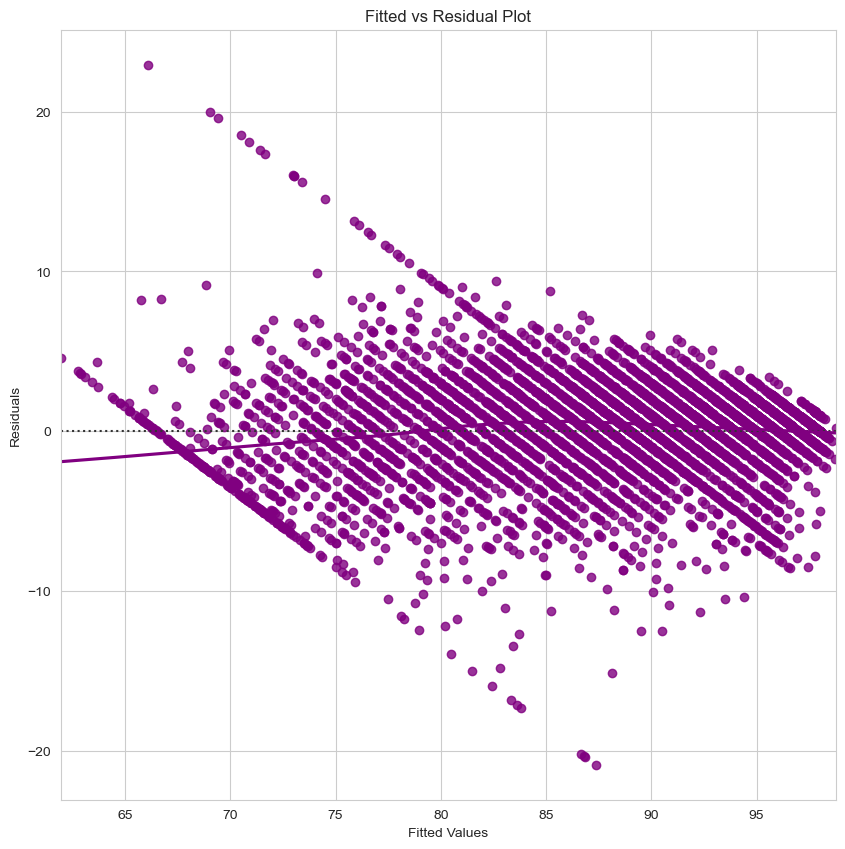

In [61]:
# Let us plot the fitted values vs residuals
sns.set_style('whitegrid')
sns.residplot(data=df_pred, x='Fitted Values', y= 'Residuals',color = 'purple',lowess=True)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Fitted vs Residual Plot')
plt.show()

* We can observe a pattern in the residual vs fitted values, hence we will try to transform the continous variables in the data

In [62]:
X_train4.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgin', 'pflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

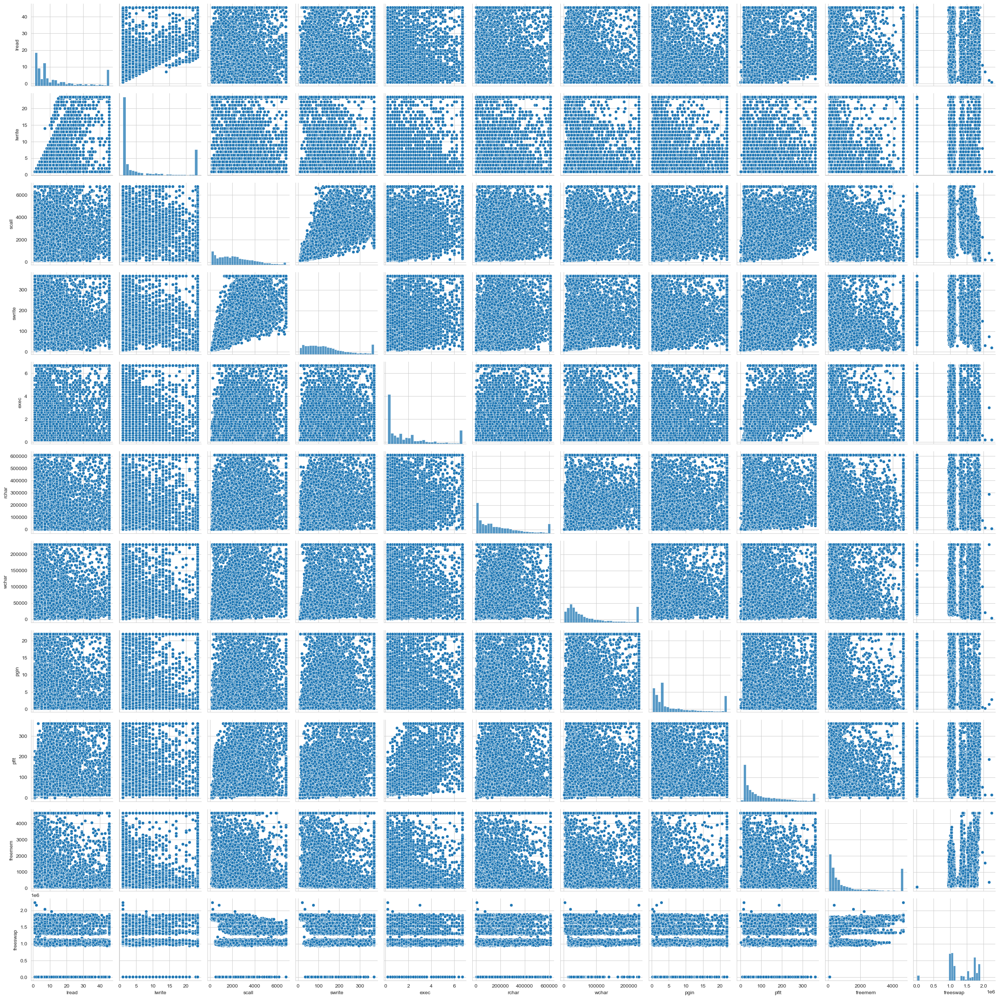

In [63]:
# checking the distribution of variable in training set with dependent variable 
sns.pairplot(df[['lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgin', 'pflt', 'freemem', 'freeswap']])
plt.show()

## Test for Normality
#### What is the test?

* Error terms/residuals should be normally distributed.
* If the error terms are not normally distributed, confidence intervals may become too wide or narrow. Once confidence interval becomes unstable, it leads to difficulty in estimating coefficients based on minimization of least squares

#### What does non-normality indicate?

* It suggests that there are a few unusual data points which must be studied closely to make a better model.

#### How to check the Normality?

* It can be checked via QQ plot- residuals following normal distribution will make a straight line plot, otherwise not.
* Another test to check for normality is the Shapiro-wilk test.

#### How to Make residuals normal?

* We can apply transformations like Log, exponential, arcsinh, etc as per our data.

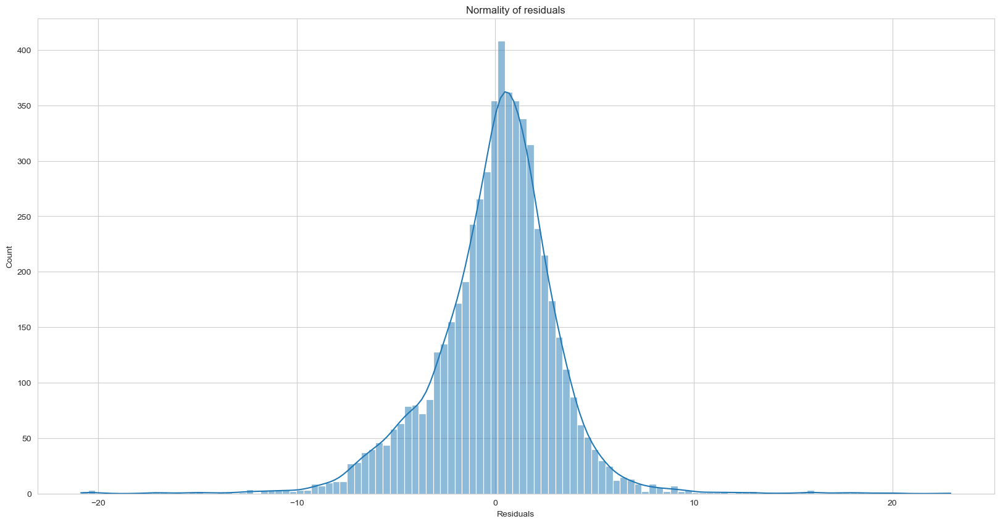

In [64]:
plt.figure(figsize=(20,10))
sns.histplot(df_pred['Residuals'], kde = True)
plt.title('Normality of residuals')
plt.show()

* The residual terms are normally distributed.

#### The QQ Plot of residuals can be used to visually check the normality assumption.  The normal probability plot of residuals should approximately follow a straight line.

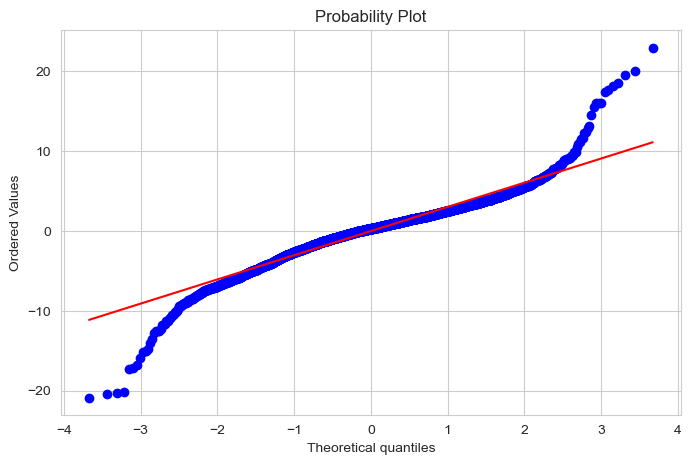

In [65]:
import pylab
import scipy.stats as stats
plt.figure(figsize=(8,5))
stats.probplot(df_pred['Residuals'], dist='norm', plot = pylab)
plt.show()

* Most of the points are lying on the straight line in QQ Plot

The Shapiro-Wilk test can also be used for checking the normality. The null alternate hypotheses of the test are as follow:

* Null hypothesis - Data is normally distributed.
* Alternate hypothesis - Data is not normally distributed.

In [66]:
stats.shapiro(df_pred['Residuals'])

ShapiroResult(statistic=0.943313717842102, pvalue=2.4396606263895065e-42)

* Since p-value < 0.05, the residuals are not normal as per shapiro test.
* Strictly speaking - the residuals are not normal. However, as an approximation, we might be willing to accept this distribution as close to being normal

### Test for Homoscedasticity

* Homoscedacity - If the variance of the residuals are symmetrically distributed across the regression line, then the data is said to homoscedastic.
* Hetroscedacity - If the cariance is unequal for theresiduals across the regression line, then the data is said to be heteroscedastic. In this case the residuals can form an arrow shape or any other non symmetrical shape.

#### Why the test?

* The presence of non-constant variance in the error terms results in heteroscedasticity. Generally, non-constant variance arises in presence of outliers.

#### How to check if model has Heteroscedasticity?

* Can use the goldfeldquandt test. if we get p-value>0.05 we can say that the residuals are homoscedastic, otherwise they are heteroscedastic.

#### How to deal with Heteroscedasticity?

* Can be fixed via adding other important features or making transformations.

The null and alternate hypothesis of the goldfeldquandt test are as follow:

* Null hypothesis: Residuals are homoscedastic
* Alternate hypothesis: Residuals have hetroscedasticity

In [69]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [70]:
name = ['F Statistic', 'p-value']
test = sms.het_goldfeldquandt(df_pred['Residuals'],X_train4)
lzip(name,test)

[('F Statistic', 1.0187220116825655), ('p-value', 0.310151542358012)]

* Since p-value >0.05 we can say that the residuals are homoscedastic

In [71]:
X_train4.columns

Index(['const', 'lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar',
       'pgin', 'pflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [72]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgin', 'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'usr',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

In [73]:
X_test2 = X_test.drop(['sread','fork','ppgin','vflt'],axis=1)

In [74]:
# let's make predictions on the test set
y_pred_train = model5.predict(X_train4)
y_pred_test = model5.predict(X_test2)

In [75]:
# Lets's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train,y_pred_train))
rmse1

3.1164922373703794

In [76]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse2

3.189310008574631

In [77]:
from sklearn.metrics import mean_absolute_error , mean_squared_error
# let's check the MAE on the train data
mae1 = mean_absolute_error(y_train, y_pred_train)
mae1

2.2332220577925606

In [78]:
 #let's check the MAE on the test data
mae2 = mean_absolute_error(y_test, y_pred_test)
mae2

2.2799060003496345

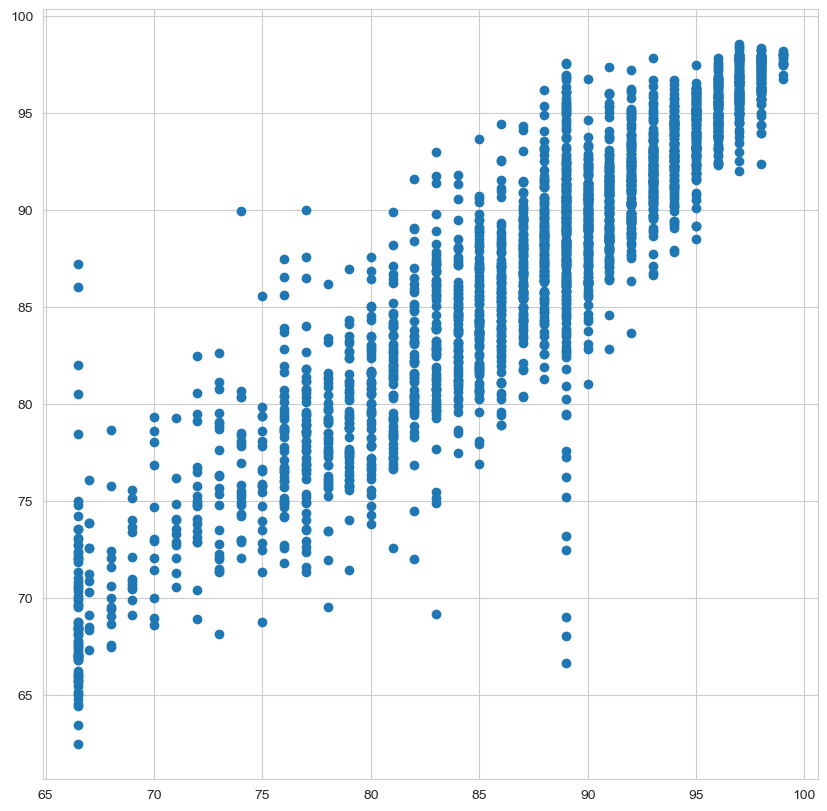

In [79]:
#sactter plot

plt.scatter(y_test, y_pred_test)
plt.show()


In [81]:
for i,j in np.array(model5.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(100.1) * const + (-0.05) * lread + (0.04) * lwrite + (-0.0) * scall + (-0.01) * swrite + (-0.52) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.19) * pgin + (-0.04) * pflt + (0.0) * freemem + (-0.0) * freeswap + (-0.7) * runqsz_Not_CPU_Bound + 

### Linear Regression using Sklearn

In [82]:
regression_model = LinearRegression()
regression_model.fit(X_train4, y_train)

LinearRegression()

In [83]:
regression_model.coef_

array([[ 0.00000000e+00, -5.10839336e-02,  3.55576509e-02,
        -1.39498532e-03, -7.58418341e-03, -5.18231740e-01,
        -3.57160564e-06, -4.44008931e-06, -1.89599049e-01,
        -3.51160651e-02,  4.59770169e-04, -1.04373406e-06,
        -7.02463132e-01]])

In [84]:
# Let us check the intercept for the model

intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 100.1006939790034


In [85]:
# Let us explore the coefficients for each of the independent attributes
for idx, col_name in enumerate(X_train4.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for const is 0.0
The coefficient for lread is -0.05108393362975446
The coefficient for lwrite is 0.035557650889686085
The coefficient for scall is -0.001394985324802202
The coefficient for swrite is -0.007584183413868606
The coefficient for exec is -0.5182317398763651
The coefficient for rchar is -3.5716056435771933e-06
The coefficient for wchar is -4.440089306068027e-06
The coefficient for pgin is -0.1895990487005919
The coefficient for pflt is -0.03511606506732973
The coefficient for freemem is 0.00045977016948855516
The coefficient for freeswap is -1.0437340550063742e-06
The coefficient for runqsz_Not_CPU_Bound is -0.7024631318940145


In [86]:
# R square on training data
regression_model.score(X_train4, y_train)

0.8586922862939549

In [87]:
# R square on testing data
regression_model.score(X_test2, y_test)

0.8393045938778542

In [88]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train4, y_train).predict(X_train4)
np.sqrt(mean_squared_error(y_train,predicted_train))

3.1164922373703794

In [89]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train4, y_train).predict(X_test2)
np.sqrt(mean_squared_error(y_test,predicted_test))

3.1893100085746995

### 1.4 Inference: Basis on these predictions, what are the business insights and recommendations.

#### Problem 2: Logistic Regression, LDA and CART

You are a statistician at the Republic of Indonesia Ministry of Health and you are provided with a data of 1473 females collected from a Contraceptive Prevalence Survey. The samples are married women who were either not pregnant or do not know if they were at the time of the survey.

The problem is to predict do/don't they use a contraceptive method of choice based on their demographic and socio-economic characteristics.

Data Dictionary:

1. Wife's age (numerical)
2. Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary
3. Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary
4. Number of children ever born (numerical)
5. Wife's religion (binary) Non-Scientology, Scientology
6. Wife's now working? (binary) Yes, No
7. Husband's occupation (categorical) 1, 2, 3, 4(random)
8. Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high
9. Media exposure (binary) Good, Not good
10. Contraceptive method used (class attribute) No,Yes

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt  
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

In [2]:
df_Log = pd.read_excel('Contraceptive_method_dataset.xlsx')

##### 2.1 Data Ingestion: Read the dataset. Do the descriptive statistics and do null value condition check, check for duplicates and outliers and write an inference on it. Perform Univariate and Bivariate Analysis and Multivariate Analysis.

In [3]:
df_Log.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [4]:
df_Log.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [5]:
df_Log.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [6]:
# Compute Mode for the 'Wife age' and 'No of children born' columns and impute the missing values
cols = ['Wife_age','No_of_children_born']
for column in cols:
    print(column)
    mode_1 = df_Log[column].mode()[0]
    print(mode_1)
    df_Log[column].fillna(value=mode_1, inplace=True)
    
df_Log.isnull().sum()

Wife_age
25.0
No_of_children_born
2.0


Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [7]:
dups = df_Log.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df_Log.shape)

Number of duplicate rows = 87
(1473, 10)


In [8]:
df_Log.drop_duplicates(inplace=True) 

In [9]:
dups = df_Log.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df_Log.shape)

Number of duplicate rows = 0
(1386, 10)


In [10]:
df_Log.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1386.0,NaN,NaN,NaN,32.227273,8.254237,16.0,25.0,31.0,38.0,49.0
Wife_ education,1386,4,Tertiary,511,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1386,4,Tertiary,822,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1386.0,NaN,NaN,NaN,3.277056,2.390657,0.0,1.25,3.0,5.0,16.0
Wife_religion,1386,2,Scientology,1179,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1386,2,No,1036,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1386.0,NaN,NaN,NaN,2.174603,0.853849,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1386,4,Very High,614,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1386,2,Exposed,1277,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1386,2,Yes,772,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Univariate Analysis

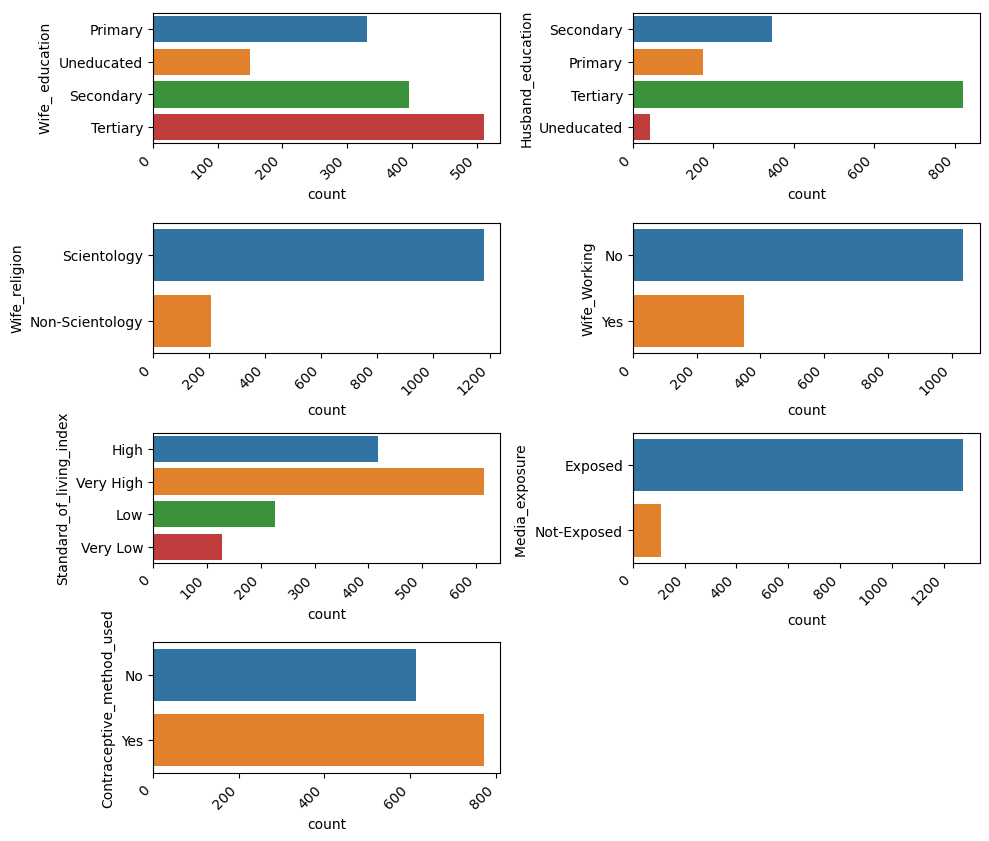

In [11]:
cols = 2
rows = 5
fig = plt.figure(figsize= (10,10))
all_cats = df_Log.select_dtypes(include='object')
cat_cols = all_cats.columns[all_cats.nunique() < 10]
for i, col in enumerate(cat_cols):

    ax=fig.add_subplot(rows, cols, i+1)

    sns.countplot(y=all_cats[col], ax=ax)

    plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

In [12]:
from pylab import rcParams
rcParams['figure.figsize'] = 8,5

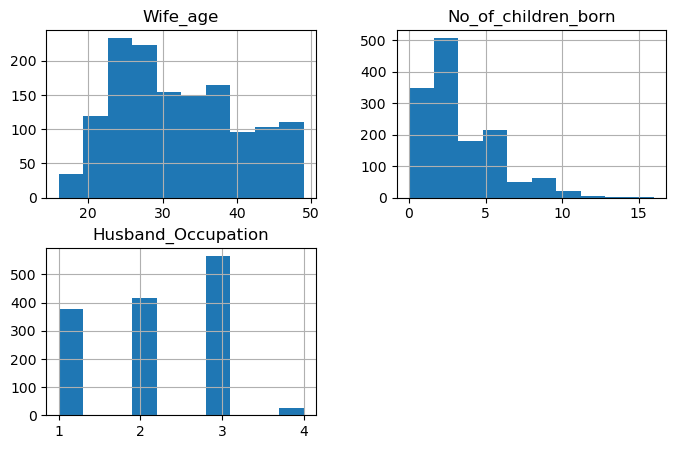

In [13]:
df_Log[['Wife_age','No_of_children_born','Husband_Occupation',]].hist();

### Bivariate Analysis

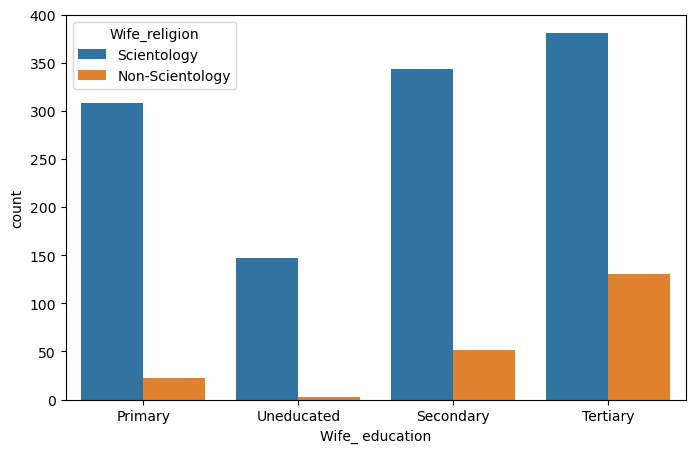

In [14]:
sns.countplot(data=df_Log,x='Wife_ education',hue='Wife_religion')
plt.show()

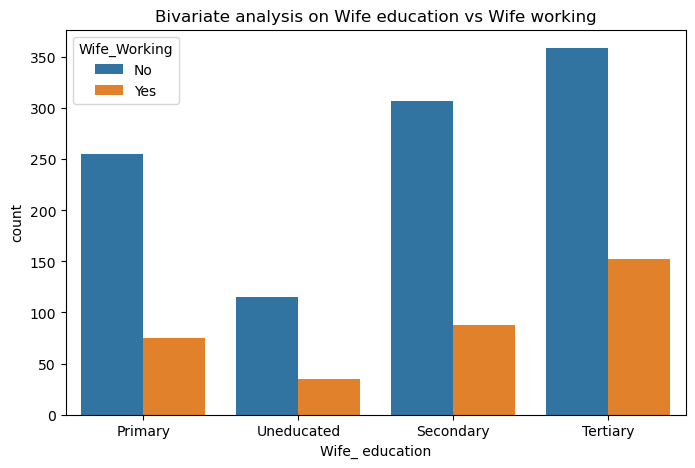

In [15]:
sns.countplot(data=df_Log,x='Wife_ education',hue='Wife_Working')
plt.title('Bivariate analysis on Wife education vs Wife working')
plt.show()

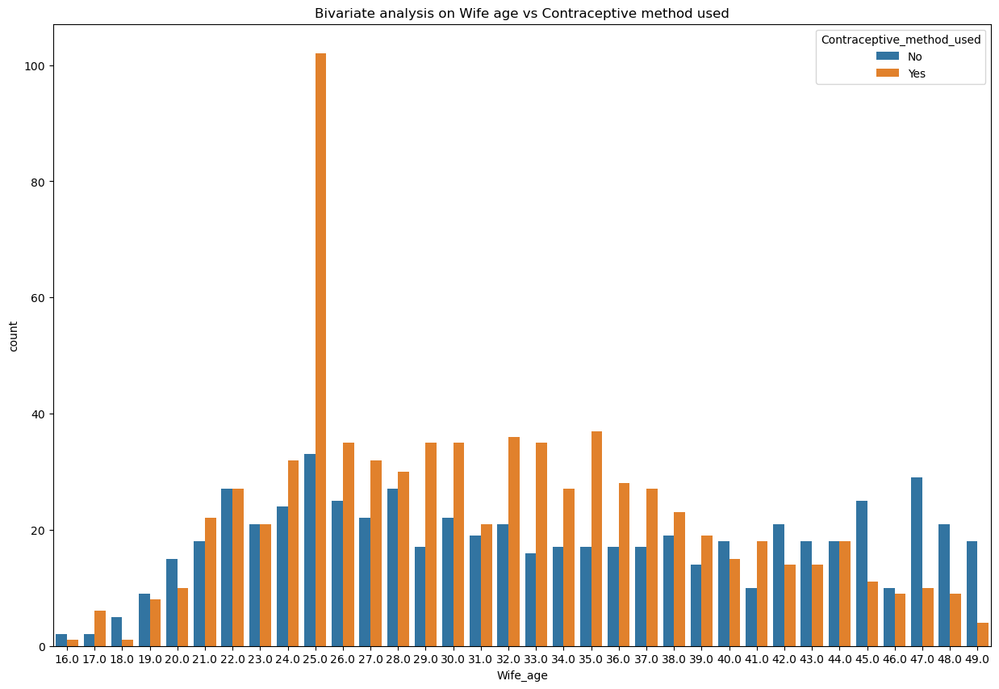

In [16]:
plt.figure(figsize=(15,10))
sns.countplot(data=df_Log, x='Wife_age', hue='Contraceptive_method_used')
plt.title('Bivariate analysis on Wife age vs Contraceptive method used')
plt.show()

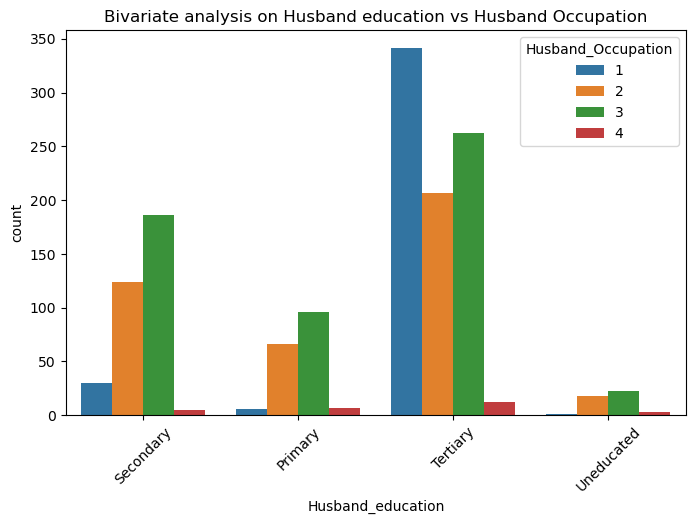

In [17]:
sns.countplot(data=df_Log,x='Husband_education', hue='Husband_Occupation')
plt.title('Bivariate analysis on Husband education vs Husband Occupation')
plt.xticks(rotation = 45)
plt.show()

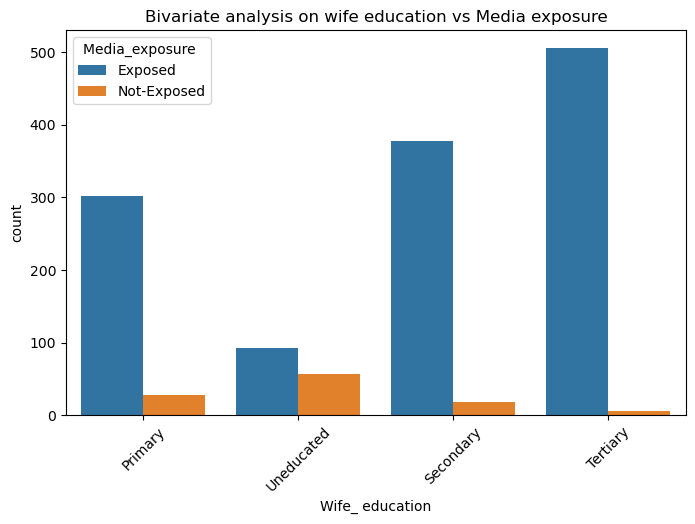

In [18]:
sns.countplot(data=df_Log,x=df_Log['Wife_ education'],hue='Media_exposure ')
plt.title('Bivariate analysis on wife education vs Media exposure')
plt.xticks(rotation = 45)
plt.show()

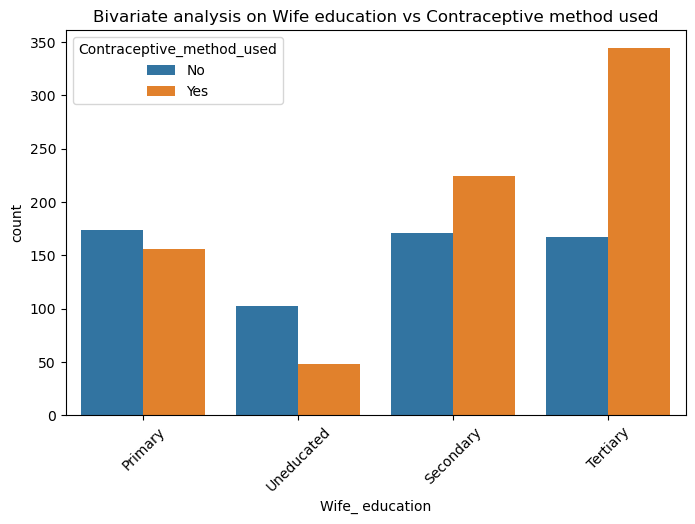

In [19]:

sns.countplot(data=df_Log,x='Wife_ education', hue='Contraceptive_method_used')
plt.title('Bivariate analysis on Wife education vs Contraceptive method used')
plt.xticks(rotation = 45)
plt.show()

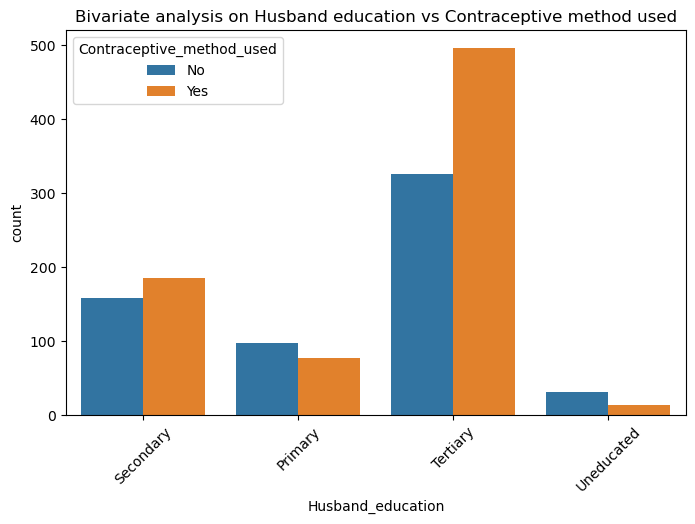

In [20]:
sns.countplot(data=df_Log,x='Husband_education',hue='Contraceptive_method_used')
plt.title('Bivariate analysis on Husband education vs Contraceptive method used')
plt.xticks(rotation = 45)
plt.show()

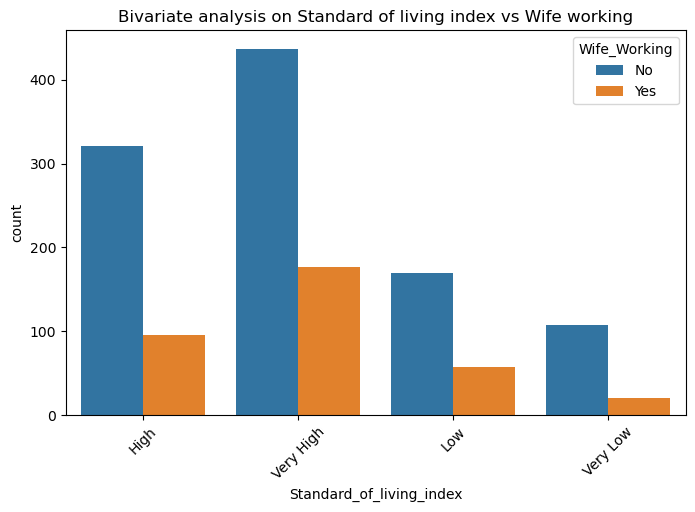

In [21]:
sns.countplot(data=df_Log,x='Standard_of_living_index',hue='Wife_Working')
plt.title('Bivariate analysis on Standard of living index vs Wife working')
plt.xticks(rotation = 45)
plt.show()

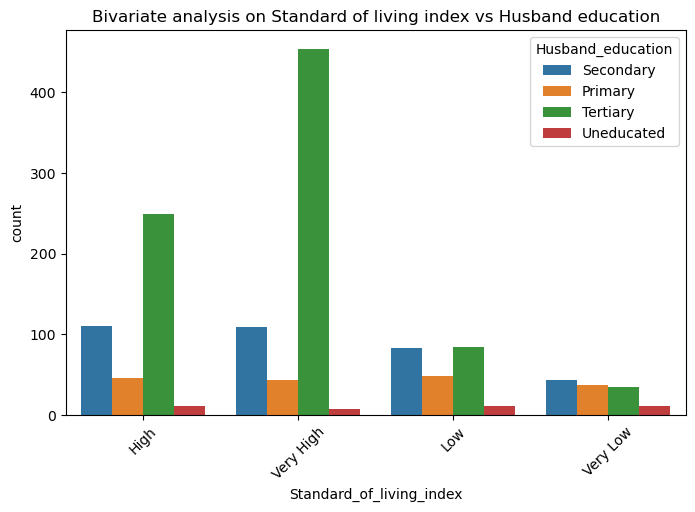

In [22]:
sns.countplot(data=df_Log,x='Standard_of_living_index',hue='Husband_education')
plt.title('Bivariate analysis on Standard of living index vs Husband education')
plt.xticks(rotation = 45)
plt.show()

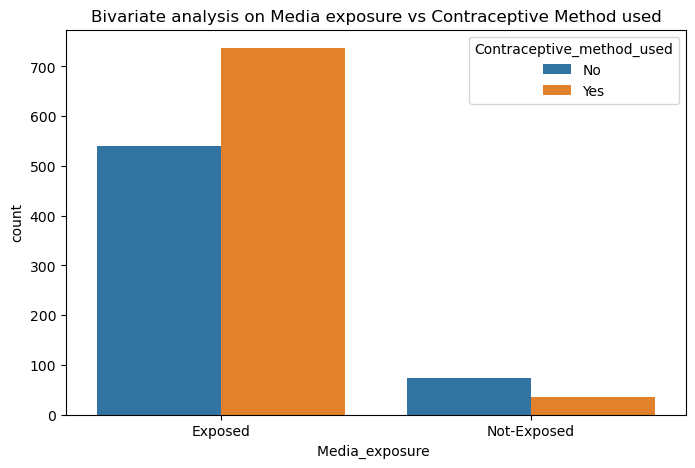

In [23]:
sns.countplot(data=df_Log,x=df_Log['Media_exposure '], hue=df_Log['Contraceptive_method_used'])
plt.title('Bivariate analysis on Media exposure vs Contraceptive Method used')
plt.show()

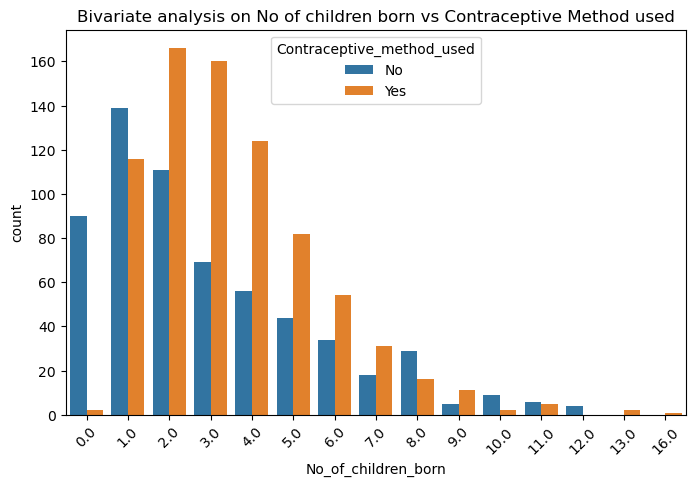

In [24]:
sns.countplot(data=df_Log,x='No_of_children_born',hue='Contraceptive_method_used')
plt.title('Bivariate analysis on No of children born vs Contraceptive Method used')
plt.xticks(rotation = 45)
plt.show()

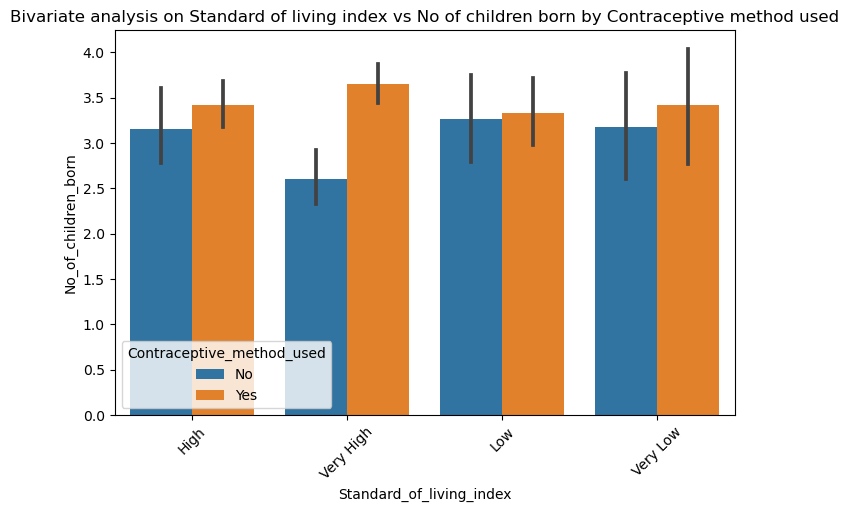

In [25]:
sns.barplot(data=df_Log,x='Standard_of_living_index', y='No_of_children_born',hue='Contraceptive_method_used')
plt.title('Bivariate analysis on Standard of living index vs No of children born by Contraceptive method used')
plt.xticks(rotation = 45 )
plt.show()

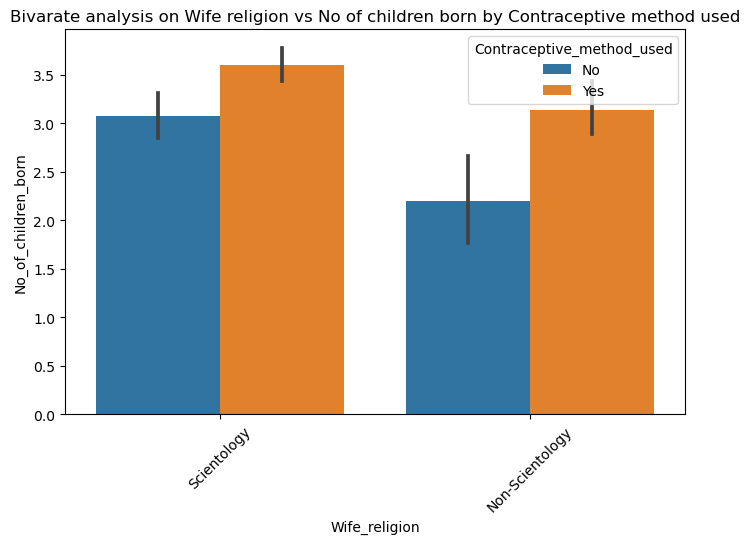

In [26]:
sns.barplot(data=df_Log, x='Wife_religion',y='No_of_children_born',hue='Contraceptive_method_used')
plt.title('Bivarate analysis on Wife religion vs No of children born by Contraceptive method used')
plt.xticks(rotation = 45)
plt.show()

### Multivariate Analysis

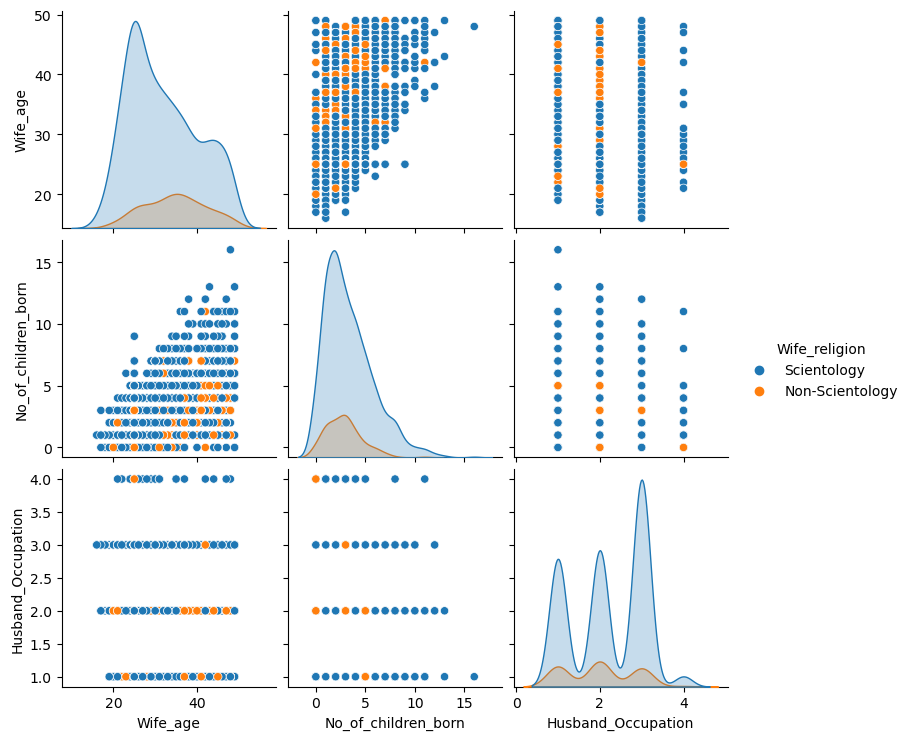

In [27]:
sns.pairplot(data=df_Log,hue='Wife_religion');

In [28]:
for feature in df_Log.columns: 
    if df_Log[feature].dtype == 'object': 
        print(feature)
        print(df_Log[feature].value_counts())
        print('\n')
        

Wife_ education
Tertiary      511
Secondary     395
Primary       330
Uneducated    150
Name: Wife_ education, dtype: int64


Husband_education
Tertiary      822
Secondary     345
Primary       175
Uneducated     44
Name: Husband_education, dtype: int64


Wife_religion
Scientology        1179
Non-Scientology     207
Name: Wife_religion, dtype: int64


Wife_Working
No     1036
Yes     350
Name: Wife_Working, dtype: int64


Standard_of_living_index
Very High    614
High         417
Low          227
Very Low     128
Name: Standard_of_living_index, dtype: int64


Media_exposure 
Exposed        1277
Not-Exposed     109
Name: Media_exposure , dtype: int64


Contraceptive_method_used
Yes    772
No     614
Name: Contraceptive_method_used, dtype: int64




### Outlier Treatment

In [29]:
df_Log['No_of_children_born'].quantile([.25,.75,.90,0.95])

0.25    1.25
0.75    5.00
0.90    6.50
0.95    8.00
Name: No_of_children_born, dtype: float64

In [30]:
df_Log[df_Log['No_of_children_born']>6]

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No
9,45.0,Uneducated,Uneducated,8.0,Scientology,No,2,Low,Not-Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1344,37.0,Secondary,Secondary,11.0,Scientology,No,1,Low,Exposed,Yes
1382,25.0,Primary,Primary,7.0,Scientology,Yes,2,Low,Not-Exposed,Yes
1398,25.0,Primary,Tertiary,7.0,Scientology,No,3,High,Exposed,Yes
1405,25.0,Uneducated,Secondary,9.0,Scientology,Yes,3,High,Exposed,Yes


* Total 139 records Outliers present in the No of Children Born columns, It is decided to clear the outliers

In [31]:
139/1386

0.10028860028860029

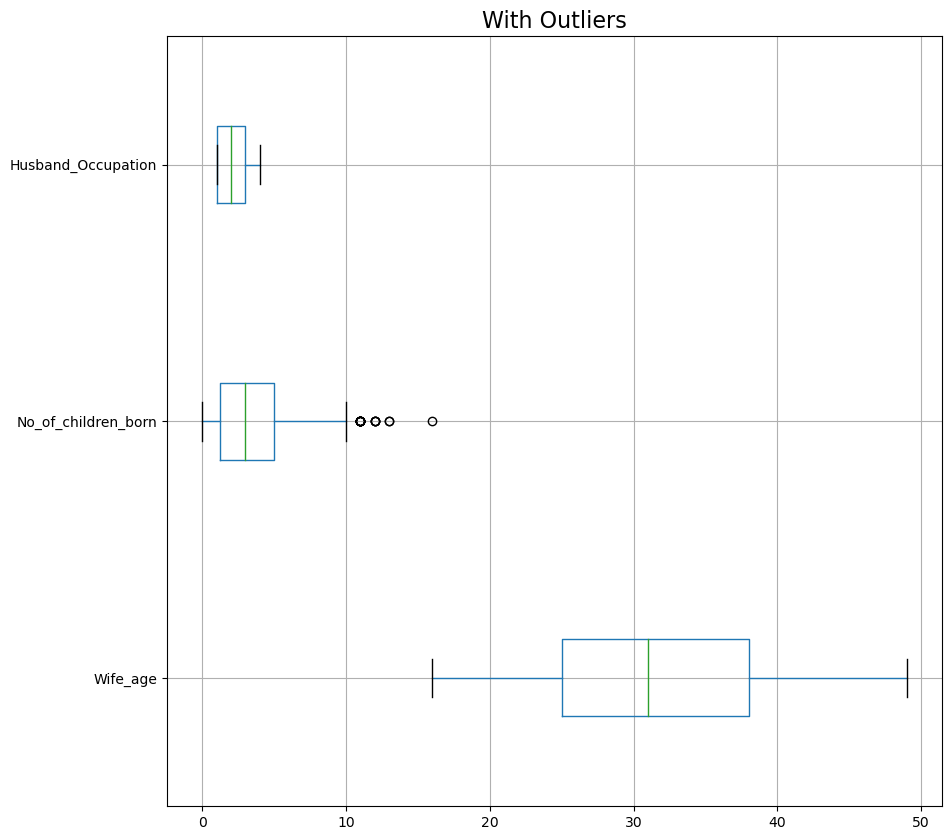

In [32]:
# construct box plot for continuous variables
cont=df_Log.dtypes[(df_Log.dtypes!='object')].index# & (df.dtypes!='bool')].index
plt.figure(figsize=(10,10))
df_Log[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

* Outliers were present only in the No of Children Born columns, We are proceeding without treating outliers.

###  2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression and LDA (linear discriminant analysis) and CART.

### Data Encode Catagorical Variable with Numeric Value 

In [33]:
df_Log['Wife_ education']=np.where(df_Log['Wife_ education'] =='Uneducated', '1', df_Log['Wife_ education'])
df_Log['Wife_ education']=np.where(df_Log['Wife_ education'] =='Primary', '2', df_Log['Wife_ education'])
df_Log['Wife_ education']=np.where(df_Log['Wife_ education'] =='Secondary', '3', df_Log['Wife_ education'])
df_Log['Wife_ education']=np.where(df_Log['Wife_ education'] =='Tertiary', '4', df_Log['Wife_ education'])

In [34]:
df_Log['Husband_education']=np.where(df_Log['Husband_education'] =='Uneducated', '1', df_Log['Husband_education'])
df_Log['Husband_education']=np.where(df_Log['Husband_education'] =='Primary', '2', df_Log['Husband_education'])
df_Log['Husband_education']=np.where(df_Log['Husband_education'] =='Secondary', '3', df_Log['Husband_education'])
df_Log['Husband_education']=np.where(df_Log['Husband_education'] =='Tertiary', '4', df_Log['Husband_education'])

In [35]:
df_Log['Standard_of_living_index']=np.where(df_Log['Standard_of_living_index'] =='Very Low', '1', df_Log['Standard_of_living_index'])
df_Log['Standard_of_living_index']=np.where(df_Log['Standard_of_living_index'] =='Low', '2', df_Log['Standard_of_living_index'])
df_Log['Standard_of_living_index']=np.where(df_Log['Standard_of_living_index'] =='High', '3', df_Log['Standard_of_living_index'])
df_Log['Standard_of_living_index']=np.where(df_Log['Standard_of_living_index'] =='Very High', '4', df_Log['Standard_of_living_index'])

In [36]:
df_Log['Wife_Working'] = np.where(df_Log['Wife_Working']=='No','0',df_Log['Wife_Working'])
df_Log['Wife_Working'] = np.where(df_Log['Wife_Working']=='Yes','1',df_Log['Wife_Working'])

In [37]:
df_Log['Wife_religion'] = np.where(df_Log['Wife_religion']=='Non-Scientology','0',df_Log['Wife_religion'])
df_Log['Wife_religion'] = np.where(df_Log['Wife_religion']=='Scientology','1',df_Log['Wife_religion'])

In [38]:
df_Log['Media_exposure '] = np.where(df_Log['Media_exposure ']=='Not-Exposed','0',df_Log['Wife_religion'])
df_Log['Media_exposure '] = np.where(df_Log['Media_exposure ']=='Exposed','1',df_Log['Wife_religion'])

In [39]:
df_Log['Wife_ education'] = df_Log['Wife_ education'].astype('int64')
df_Log['Husband_education'] = df_Log['Husband_education'].astype('int64')
df_Log['Husband_Occupation'] = df_Log['Husband_Occupation'].astype('int64')
df_Log['Standard_of_living_index'] = df_Log['Standard_of_living_index'].astype('int64')
df_Log['Wife_religion']= df_Log['Wife_religion'].astype('int64')
df_Log['Wife_Working'] = df_Log['Wife_Working'].astype('int64')
df_Log['Media_exposure ']=df_Log['Media_exposure '].astype('int64')
df_Log.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1386 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1386 non-null   float64
 1   Wife_ education            1386 non-null   int64  
 2   Husband_education          1386 non-null   int64  
 3   No_of_children_born        1386 non-null   float64
 4   Wife_religion              1386 non-null   int64  
 5   Wife_Working               1386 non-null   int64  
 6   Husband_Occupation         1386 non-null   int64  
 7   Standard_of_living_index   1386 non-null   int64  
 8   Media_exposure             1386 non-null   int64  
 9   Contraceptive_method_used  1386 non-null   object 
dtypes: float64(2), int64(7), object(1)
memory usage: 151.4+ KB


In [40]:
df_Log.describe()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
count,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000
mean,32.227273,2.914141,3.403319,3.277056,0.850649,0.252525,2.174603,3.094517,0.850649
std,8.254237,1.016394,0.827132,2.390657,0.356562,0.434618,0.853849,0.983847,0.356562
min,16.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,25.000000,2.000000,3.000000,1.250000,1.000000,0.000000,1.000000,2.000000,1.000000
50%,31.000000,3.000000,4.000000,3.000000,1.000000,0.000000,2.000000,3.000000,1.000000
75%,38.000000,4.000000,4.000000,5.000000,1.000000,1.000000,3.000000,4.000000,1.000000
max,49.000000,4.000000,4.000000,16.000000,1.000000,1.000000,4.000000,4.000000,1.000000


In [41]:
from pylab import rcParams

In [42]:
rcParams['figure.figsize'] = 8,8

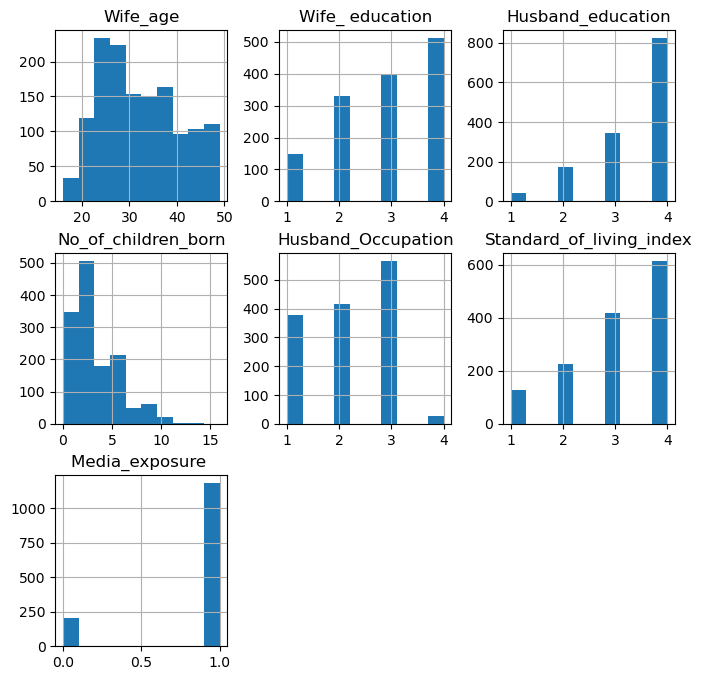

In [43]:
df_Log[['Wife_age','Wife_ education','Husband_education','No_of_children_born','Husband_Occupation','Standard_of_living_index','Media_exposure ']].hist();

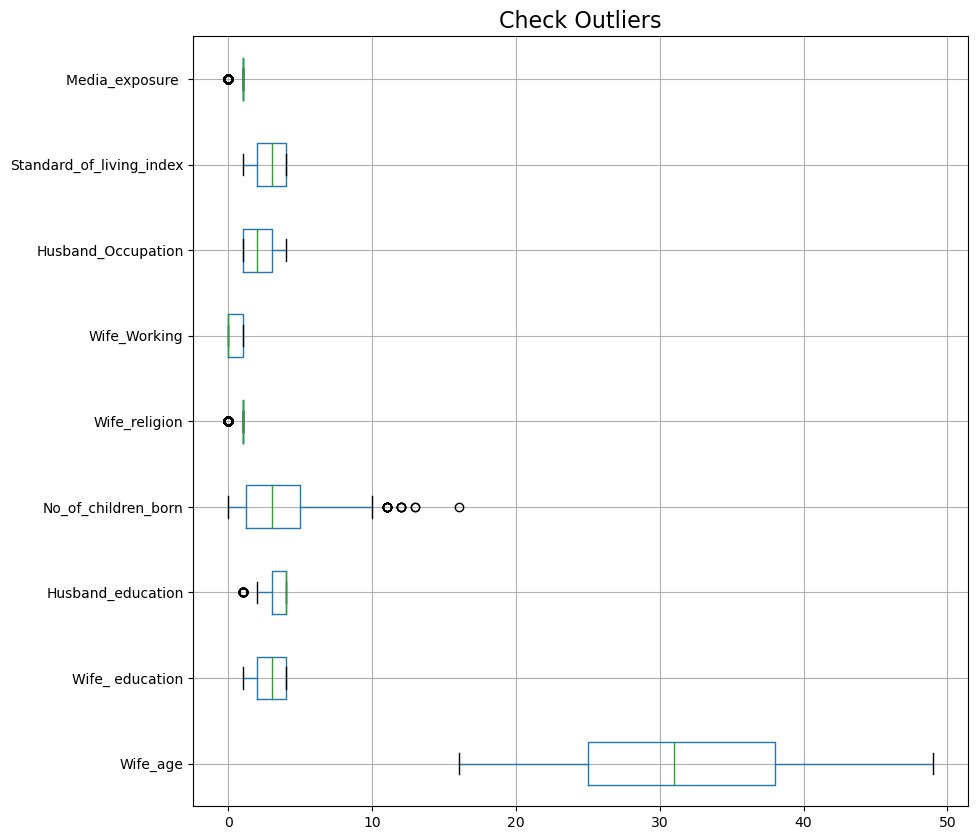

In [44]:
# construct box plot for continuous variables
cont=df_Log.dtypes[(df_Log.dtypes!='object')].index# & (df.dtypes!='bool')].index
plt.figure(figsize=(10,10))
df_Log[cont].boxplot(vert=0)
plt.title('Check Outliers',fontsize=16)
plt.show()

In [45]:
df_Log.corr()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
Wife_age,1.000000,-0.056969,-0.061131,0.512499,-0.126575,0.031690,-0.198641,0.164057,-0.126575
Wife_ education,-0.056969,1.000000,0.606338,-0.190777,-0.238622,0.060558,-0.370411,0.340981,-0.238622
Husband_education,-0.061131,0.606338,1.000000,-0.184349,-0.182420,-0.004342,-0.317541,0.340852,-0.182420
No_of_children_born,0.512499,-0.190777,-0.184349,1.000000,0.082459,-0.105605,-0.022301,-0.005309,0.082459
Wife_religion,-0.126575,-0.238622,-0.182420,0.082459,1.000000,-0.054639,0.090458,-0.202599,1.000000
Wife_Working,0.031690,0.060558,-0.004342,-0.105605,-0.054639,1.000000,-0.013836,0.079226,-0.054639
Husband_Occupation,-0.198641,-0.370411,-0.317541,-0.022301,0.090458,-0.013836,1.000000,-0.268912,0.090458
Standard_of_living_index,0.164057,0.340981,0.340852,-0.005309,-0.202599,0.079226,-0.268912,1.000000,-0.202599
Media_exposure,-0.126575,-0.238622,-0.182420,0.082459,1.000000,-0.054639,0.090458,-0.202599,1.000000


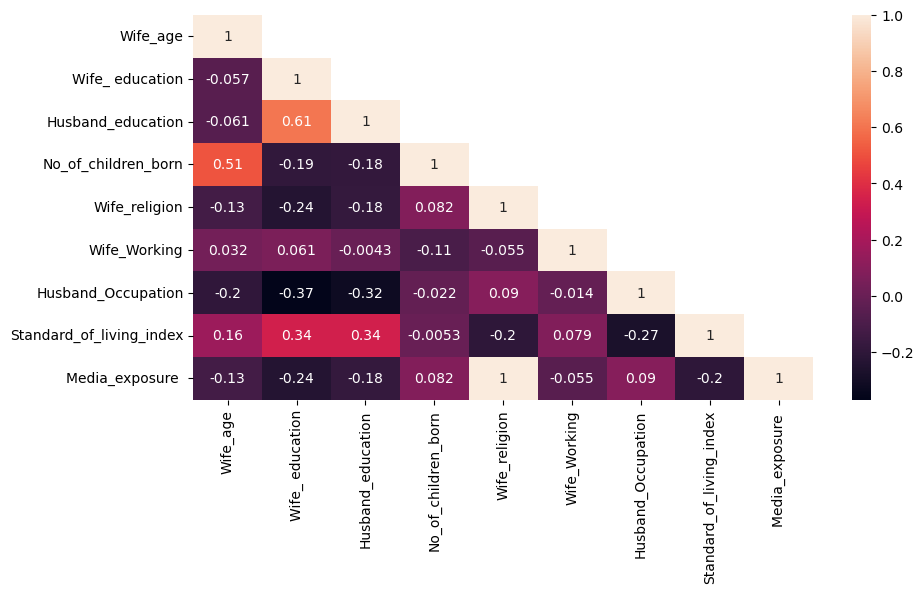

In [46]:
plt.figure(figsize=(10,5))
sns.heatmap(df_Log.corr(), annot=True,mask=np.triu(df_Log.corr(),+1));

In [47]:
df_Log.describe()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure
count,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000,1386.000000
mean,32.227273,2.914141,3.403319,3.277056,0.850649,0.252525,2.174603,3.094517,0.850649
std,8.254237,1.016394,0.827132,2.390657,0.356562,0.434618,0.853849,0.983847,0.356562
min,16.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,25.000000,2.000000,3.000000,1.250000,1.000000,0.000000,1.000000,2.000000,1.000000
50%,31.000000,3.000000,4.000000,3.000000,1.000000,0.000000,2.000000,3.000000,1.000000
75%,38.000000,4.000000,4.000000,5.000000,1.000000,1.000000,3.000000,4.000000,1.000000
max,49.000000,4.000000,4.000000,16.000000,1.000000,1.000000,4.000000,4.000000,1.000000


<Figure size 1000x500 with 0 Axes>

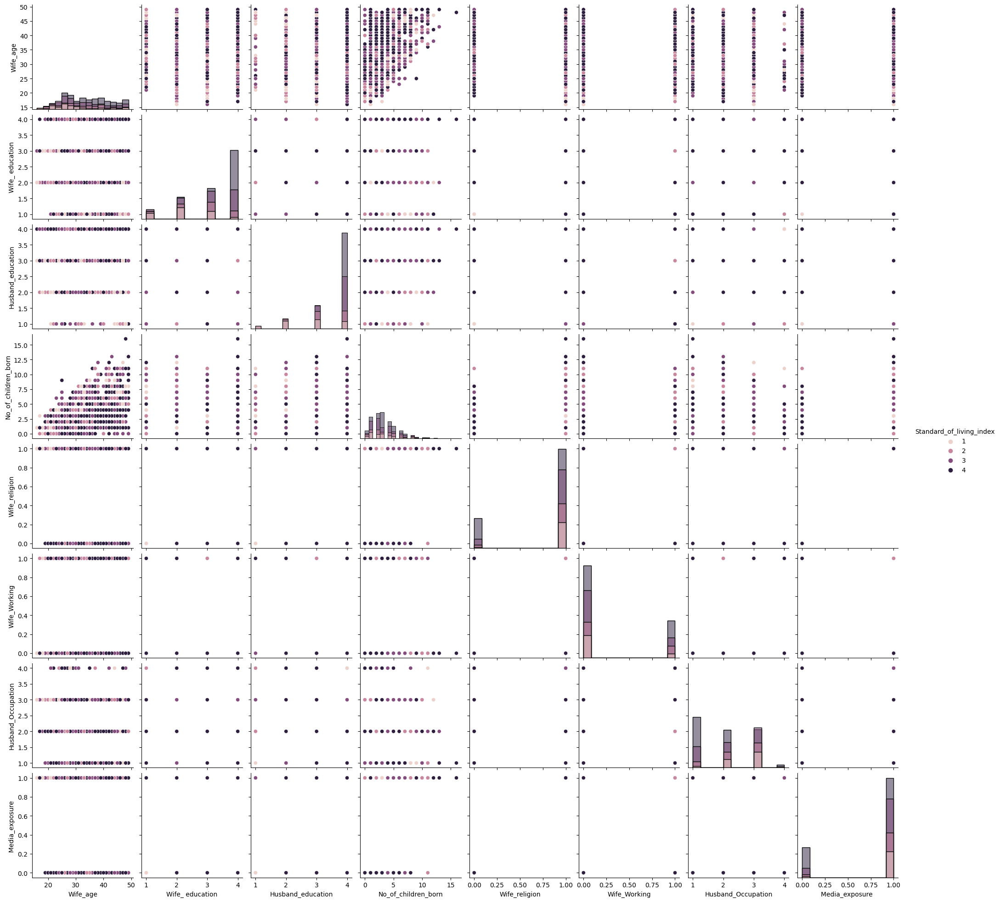

In [48]:
# Pairplot using sns
plt.figure(figsize=(10,5))
sns.pairplot(df_Log ,diag_kind='hist' ,hue='Standard_of_living_index')
plt.show()

In [49]:
df_Log.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1386 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1386 non-null   float64
 1   Wife_ education            1386 non-null   int64  
 2   Husband_education          1386 non-null   int64  
 3   No_of_children_born        1386 non-null   float64
 4   Wife_religion              1386 non-null   int64  
 5   Wife_Working               1386 non-null   int64  
 6   Husband_Occupation         1386 non-null   int64  
 7   Standard_of_living_index   1386 non-null   int64  
 8   Media_exposure             1386 non-null   int64  
 9   Contraceptive_method_used  1386 non-null   object 
dtypes: float64(2), int64(7), object(1)
memory usage: 151.4+ KB


In [50]:
df_Log.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [51]:
df_Log.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,1,0,2,3,1,No
1,45.0,1,3,10.0,1,0,3,4,1,No
2,43.0,2,3,7.0,1,0,3,4,1,No
3,42.0,3,2,9.0,1,0,3,3,1,No
4,36.0,3,3,8.0,1,0,3,2,1,No


In [52]:
df_Log_dummy = pd.get_dummies(df_Log,drop_first=True)
df_Log_dummy.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used_Yes
0,24.0,2,3,3.0,1,0,2,3,1,0
1,45.0,1,3,10.0,1,0,3,4,1,0
2,43.0,2,3,7.0,1,0,3,4,1,0
3,42.0,3,2,9.0,1,0,3,3,1,0
4,36.0,3,3,8.0,1,0,3,2,1,0


### Train and Test Data Split

In [53]:
# Copy all the predictor variables into X dataframe
X = df_Log_dummy.drop('Contraceptive_method_used_Yes', axis=1)

# Copy target into the y dataframe. 
y = df_Log_dummy['Contraceptive_method_used_Yes']

 - Data Split: Split the data into train and test (70:30). 
 - Apply Logistic Regression and LDA (linear discriminant analysis) and CART.

In [54]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1,stratify=df_Log_dummy['Contraceptive_method_used_Yes'])

In [55]:
y_train.value_counts(1)

1    0.556701
0    0.443299
Name: Contraceptive_method_used_Yes, dtype: float64

In [56]:
y_test.value_counts(1)

1    0.557692
0    0.442308
Name: Contraceptive_method_used_Yes, dtype: float64

### Logistic Regression

In [57]:
# Fit the Logistic Regression model
log_model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2)
log_model.fit(X_train, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    2.3s finished


LogisticRegression(max_iter=10000, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

In [58]:
ytrain_predict_log = log_model.predict(X_train)
ytest_predict_log = log_model.predict(X_test)

In [59]:
ytrain_predict_prob = log_model.predict_proba(X_train)
pd.DataFrame(ytrain_predict_prob).head()

,0,1
0,0.270829,0.729171
1,0.771968,0.228032
2,0.266501,0.733499
3,0.515466,0.484534
4,0.434919,0.565081


In [60]:
ytest_predict_prob=log_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.614836,0.385164
1,0.319321,0.680679
2,0.329560,0.670440
3,0.223773,0.776227
4,0.368154,0.631846


In [61]:
log_model.coef_

array([[-0.08870726,  0.5300638 ,  0.03386338,  0.34667994, -0.25011805,
        -0.18548908,  0.13069711,  0.32580101, -0.25011805]])

In [62]:
# Let us explore the coefficients for each of the independent attributes
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, log_model.coef_[0][idx]))

The coefficient for Wife_age is -0.08870726429410186
The coefficient for Wife_ education is 0.5300638034538248
The coefficient for Husband_education is 0.03386337603561785
The coefficient for No_of_children_born is 0.34667993835520694
The coefficient for Wife_religion is -0.25011805384654706
The coefficient for Wife_Working is -0.18548907663031086
The coefficient for Husband_Occupation is 0.13069710600796386
The coefficient for Standard_of_living_index is 0.3258010065283139
The coefficient for Media_exposure  is -0.25011805384654706


In [63]:
log_model.intercept_

array([-0.50395564])

In [64]:
# Accuracy - Training Data
log_model.score(X_train, y_train)

0.6793814432989691

In [65]:
# Accuracy - Test Data
log_model.score(X_test, y_test)

0.65625

**Applying GridSearchCV for Logistic Regression**

In [66]:
grid={'penalty':['l2','none'],
      'solver':['sag','lbfgs'],
      'tol':[0.0001,0.00001]}

In [67]:
model_GR = LogisticRegression(max_iter=10000,n_jobs=2)

In [68]:
grid_search = GridSearchCV(estimator = model_GR, param_grid = grid, cv = 3,n_jobs=-1,scoring='f1')

In [69]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none'], 'solver': ['sag', 'lbfgs'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [70]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'sag', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=2, solver='sag')


In [71]:
best_model = grid_search.best_estimator_

In [72]:
# Accuracy Score - Train set 
best_model.score(X_train,y_train)

0.677319587628866

In [73]:
# Accuracy Score - Test set
best_model.score(X_test,y_test)

0.6610576923076923

In [74]:
# Prediction on the training set

ytrain_predict_grid = best_model.predict(X_train)
ytest_predict_grid = best_model.predict(X_test)

In [75]:
# The Probabilities on the Train set
ytrain_predict_prob= best_model.predict_proba(X_train)
pd.DataFrame(ytrain_predict_prob).head() 

,0,1
0,0.271069,0.728931
1,0.773980,0.226020
2,0.261475,0.738525
3,0.512786,0.487214
4,0.431494,0.568506


In [76]:
## Getting the probabilities on the test set

ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.613139,0.386861
1,0.315661,0.684339
2,0.330048,0.669952
3,0.223270,0.776730
4,0.368513,0.631487


**LDA Model**

In [77]:
# Import LDA libraries 
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [78]:
#Build LDA Model and fit the data
df_lda = LinearDiscriminantAnalysis()
lda_model = df_lda.fit(X_train, y_train)


In [79]:
lda_model.intercept_

array([-0.45270084])

In [80]:
lda_model.coef_

array([[-0.08550343,  0.52289062,  0.02303752,  0.32762947, -0.25483155,
        -0.18767405,  0.12378978,  0.33114129, -0.25483155]])

In [81]:
X_train.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure '],
      dtype='object')

In [82]:
a = lda_model.coef_
np.round(a,2)

array([[-0.09,  0.52,  0.02,  0.33, -0.25, -0.19,  0.12,  0.33, -0.25]])

In [83]:
# Accuracy Score - Train set 
lda_model.score(X_train,y_train)

0.6742268041237114

In [84]:
#Accuracy Score - Test set 
lda_model.score(X_test,y_test)

0.65625

In [85]:
# Training Data Class Prediction with a cut-off value of 0.5 as default
lda_ytrain_predict = lda_model.predict(X_train)
# Test Data Class Prediction with a cut-off value of 0.5 as default
lda_ytest_predict = lda_model.predict(X_test)

In [86]:
# Training Data Probability Prediction
pred_prob_train = lda_model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = lda_model.predict_proba(X_test)

In [87]:
pd.DataFrame(pred_prob_train).head()

,0,1
0,0.273868,0.726132
1,0.764525,0.235475
2,0.270408,0.729592
3,0.506690,0.493310
4,0.440224,0.559776


In [88]:
pd.DataFrame(pred_prob_test).head()

,0,1
0,0.601870,0.398130
1,0.315159,0.684841
2,0.325438,0.674562
3,0.222788,0.777212
4,0.356898,0.643102


**CART Model**

In [89]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()

In [90]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [91]:
cart_ytrain_predict = dt_model.predict(X_train)
cart_ytest_predict = dt_model.predict(X_test)

In [92]:
#Accuracy Score - Train set 
dt_model.score(X_train,y_train)

0.9876288659793815

In [93]:
# Accuracy Score - Test Set 
dt_model.score(X_test,y_test)

0.6057692307692307

In [94]:
# Training Data Probability Prediction
pred_prob_train = dt_model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = dt_model.predict_proba(X_test)

In [95]:
pd.DataFrame(pred_prob_train).head()

,0,1
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,0.0,1.0
4,1.0,0.0


In [96]:
pd.DataFrame(pred_prob_test).head()

,0,1
0,0.0,1.0
1,0.0,1.0
2,0.0,1.0
3,0.0,1.0
4,1.0,0.0


In [97]:
from sklearn import tree

train_char_label = ['No', 'Yes']
Credit_Tree_File = open('Contraceptive.dot','w')  
dot_data = tree.export_graphviz(dt_model, out_file=Credit_Tree_File, feature_names = list(X_train), class_names = train_char_label)

Credit_Tree_File.close()


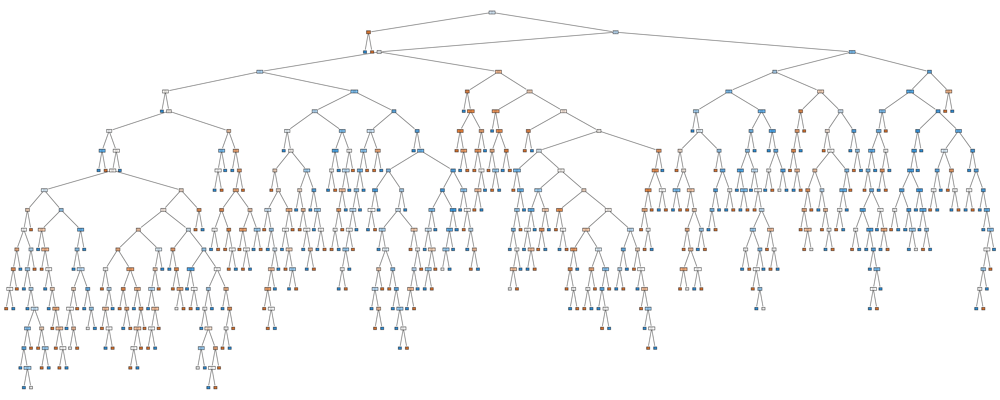

In [98]:
# If graphviz doesn't work, we can use plot_tree method from sklearn.tree

import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(X_train)
cn = ['0','1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50, 20), dpi=200)
plot_tree(dt_model, feature_names = fn, class_names=cn, filled = True)

fig.savefig('Contraceiptive.png')

## Decision Tree using GridsearchCV

In [149]:
param_grid = {
    'max_depth': [10,15,20,25,30],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [15,30,35,40,50],
    'criterion' :['gini', 'entropy']
}

dtr=tree.DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtr, param_grid = param_grid, cv = 3)


grid_search.fit(X_train,y_train)

print(grid_search.best_params_)

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 15, 'min_samples_split': 15}


In [99]:
reg_dt_model = DecisionTreeClassifier(criterion ='gini', max_depth= 10, min_samples_leaf= 15, min_samples_split= 15)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=15, min_samples_split=15)

In [100]:
regcart_ytrain_predict = reg_dt_model.predict(X_train)
regcart_ytest_predict = reg_dt_model.predict(X_test)

In [101]:
# Accuracy Score - Train Set 
reg_dt_model.score(X_train,y_train)

0.765979381443299

In [102]:
# Accuracy Score - Test Set 
reg_dt_model.score(X_test,y_test)

0.6875

In [103]:
# Training Data Probability Prediction
pred_prob_train = reg_dt_model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = reg_dt_model.predict_proba(X_test)

In [104]:
pd.DataFrame(pred_prob_train).head()

,0,1
0,0.333333,0.666667
1,0.846154,0.153846
2,0.117647,0.882353
3,0.500000,0.500000
4,0.966667,0.033333


In [105]:
pd.DataFrame(pred_prob_test).head()

,0,1
0,0.407407,0.592593
1,0.312500,0.687500
2,0.312500,0.687500
3,0.600000,0.400000
4,0.428571,0.571429


In [106]:
from sklearn import tree

train_char_label = ['No', 'Yes']
Credit_Tree_File = open('Contraceptive_Reg.dot','w')  
dot_data = tree.export_graphviz(reg_dt_model, out_file=Credit_Tree_File, feature_names = list(X_train), class_names = train_char_label)

Credit_Tree_File.close()


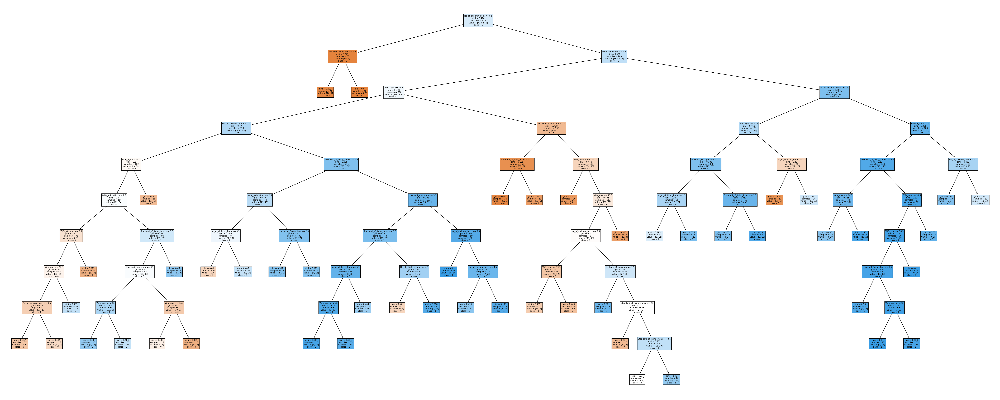

In [107]:
# If graphviz doesn't work, we can use plot_tree method from sklearn.tree

import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fn = list(X_train)
cn = ['0','1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (50, 20), dpi=200)
plot_tree(reg_dt_model, feature_names = fn, class_names=cn, filled = True)

fig.savefig('Contraceiptive_reg.png')

C:\Users\kisho\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


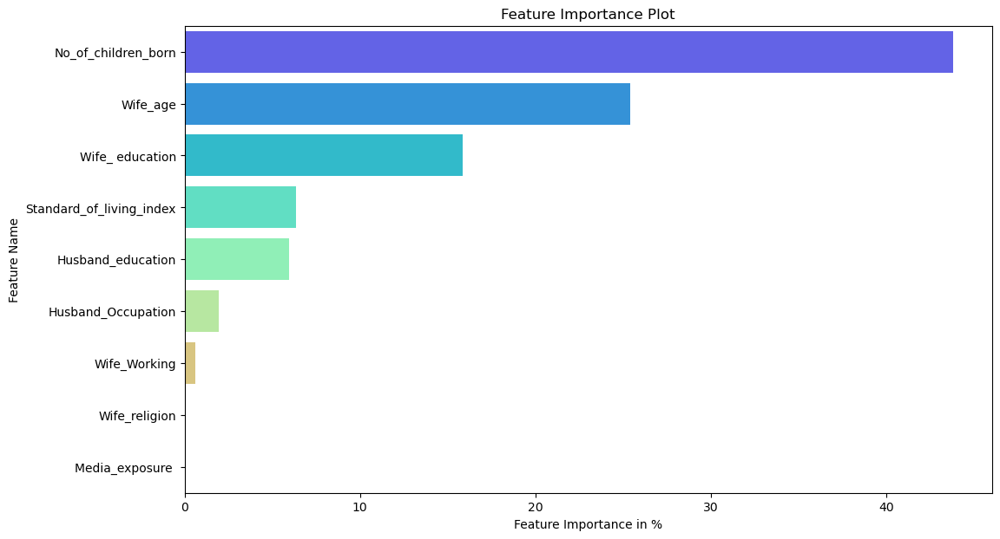

In [108]:
x=pd.DataFrame(reg_dt_model.feature_importances_*100,index=X_train.columns).sort_values(by=0,ascending=False)
plt.figure(figsize=(12,7))
sns.barplot(x[0],x.index,palette='rainbow')
plt.ylabel('Feature Name')
plt.xlabel('Feature Importance in %')
plt.title('Feature Importance Plot')
plt.show()

In [109]:
print(pd.DataFrame(reg_dt_model.feature_importances_*100,columns=['Imp'],index=X_train.columns).sort_values('Imp',ascending=False))

                                Imp
No_of_children_born       43.848082
Wife_age                  25.400082
Wife_ education           15.872197
Standard_of_living_index   6.359136
Husband_education          5.971551
Husband_Occupation         1.945937
Wife_Working               0.603016
Wife_religion              0.000000
Media_exposure             0.000000


**2.3 Performance Metrics: Check the performance of Predictions on Train and Test sets using Accuracy, Confusion Matrix, Plot ROC curve and get ROC_AUC score for each model Final Model: Compare Both the models and write inference which model is best/optimized.**

### Logistice Regression Train and Test set Accuracy, Confusion Matrix, ROC_AUC_Score and ROC Curve

In [110]:
print('Logistic Regression Confusion Matrix on Train Data \n',confusion_matrix(y_train, ytrain_predict_log))

Logistic Regression Confusion Matrix on Train Data 
 [[238 192]
 [119 421]]


In [111]:
print('Logistic Regression Confusion Matrix on Test Data \n',confusion_matrix(y_test, ytest_predict_log))

Logistic Regression Confusion Matrix on Test Data 
 [[ 86  98]
 [ 45 187]]


C:\Users\kisho\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Logistic Regression Model Confusion Matrix')

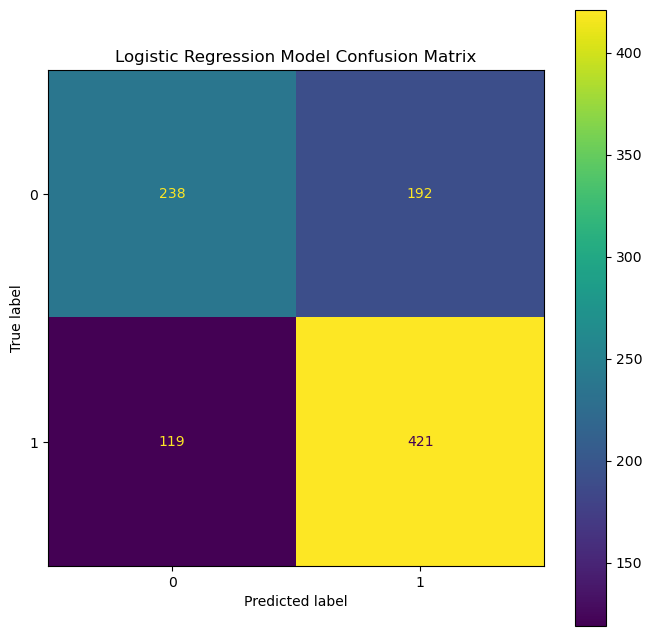

In [112]:
plot_confusion_matrix(log_model,X_train,y_train);
plt.title('Logistic Regression Model Confusion Matrix')

C:\Users\kisho\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Text(0.5, 1.0, 'Logistic Regression Model Confusion Matrix')

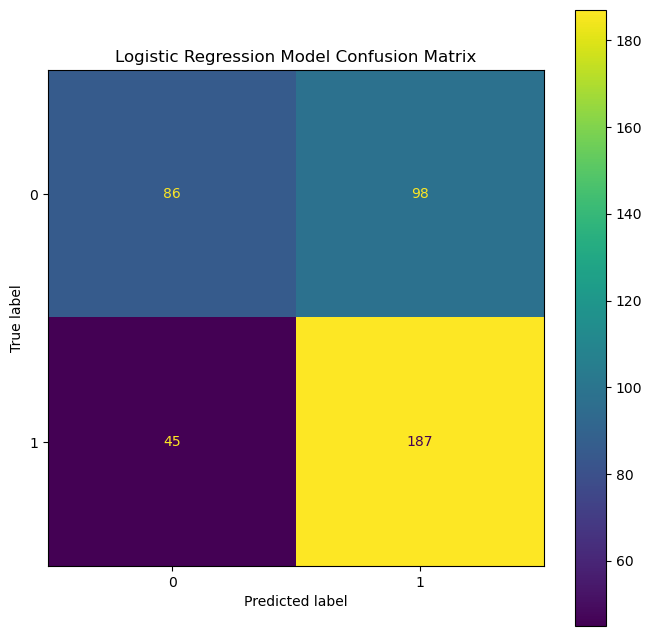

In [113]:
plot_confusion_matrix(log_model,X_test,y_test);
plt.title('Logistic Regression Model Confusion Matrix')

In [114]:
print(classification_report(y_train, ytrain_predict_log))

              precision    recall  f1-score   support

           0       0.67      0.55      0.60       430
           1       0.69      0.78      0.73       540

    accuracy                           0.68       970
   macro avg       0.68      0.67      0.67       970
weighted avg       0.68      0.68      0.67       970



In [115]:
print(classification_report(y_test, ytest_predict_log))

              precision    recall  f1-score   support

           0       0.66      0.47      0.55       184
           1       0.66      0.81      0.72       232

    accuracy                           0.66       416
   macro avg       0.66      0.64      0.63       416
weighted avg       0.66      0.66      0.64       416



AUC on Train set: 0.728
AUC on Test set : 0.728


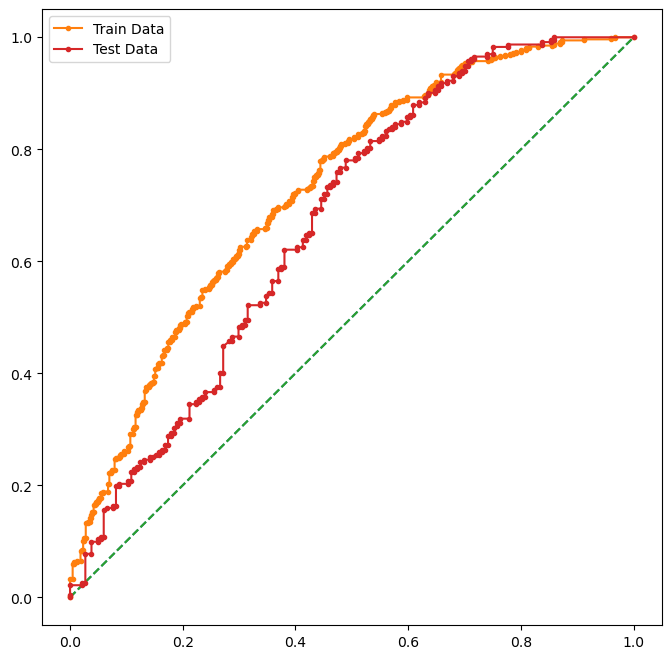

In [116]:
# predict probabilities
probs = log_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC on Train set: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr,marker ='.', label ='Train Data')


# predict probabilities
probs = log_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC on Test set : %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr, marker = '.', label = 'Test Data')
plt.legend(loc = 'best')
plt.show()

### Logistic Regression using GridSearchCV Train and Test set Accuracy, Confusion Matrix, ROC_AUC_Score and ROC Curve

C:\Users\kisho\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


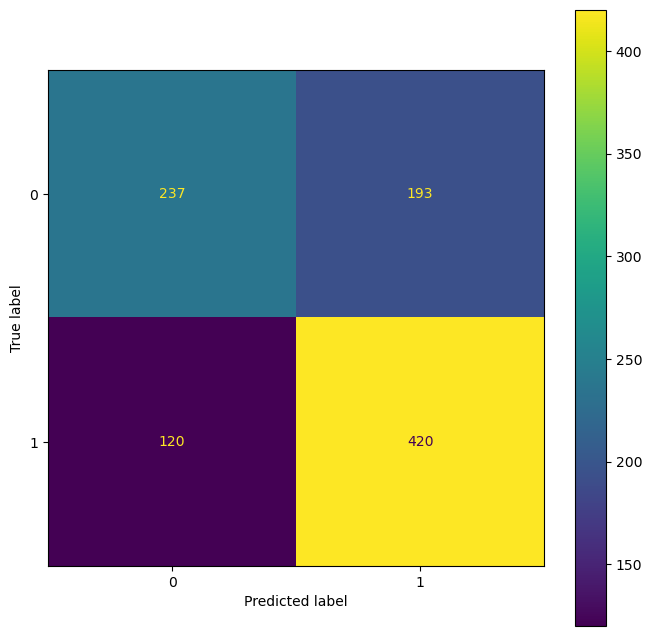

In [117]:
## Confusion matrix on the training data
plot_confusion_matrix(best_model,X_train,y_train)

C:\Users\kisho\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


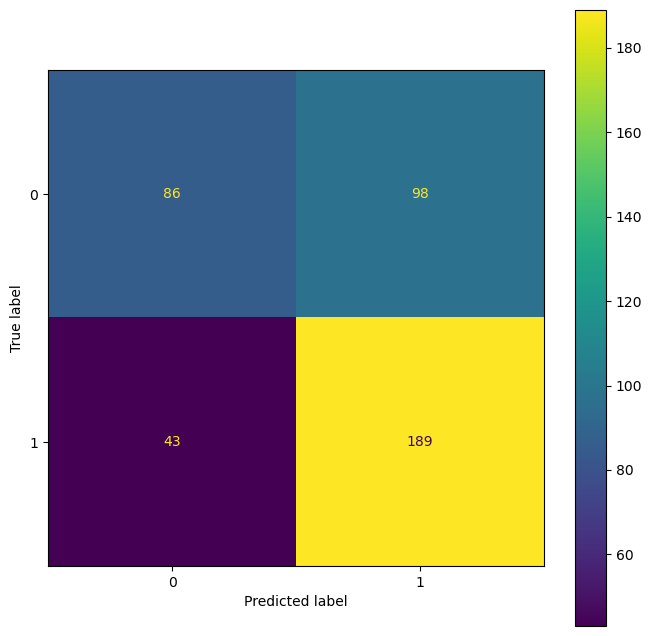

In [118]:
## Confusion matrix on the test data 
plot_confusion_matrix(best_model,X_test,y_test);

In [119]:
print('GridSearchCV Confusion Matrix on Train data \n', confusion_matrix(y_train,ytrain_predict_grid))

GridSearchCV Confusion Matrix on Train data 
 [[237 193]
 [120 420]]


In [120]:
print('GridSearchCV Confusion Matrix on Test data \n', confusion_matrix(y_test,ytest_predict_grid))

GridSearchCV Confusion Matrix on Test data 
 [[ 86  98]
 [ 43 189]]


In [121]:
print('Classification Report on Train Data \n',classification_report(y_train, ytrain_predict_grid),'\n');

Classification Report on Train Data 
               precision    recall  f1-score   support

           0       0.66      0.55      0.60       430
           1       0.69      0.78      0.73       540

    accuracy                           0.68       970
   macro avg       0.67      0.66      0.67       970
weighted avg       0.68      0.68      0.67       970
 



In [122]:
print('Classification Report on Test Data\n',classification_report(y_test, ytest_predict_grid),'\n');

Classification Report on Test Data
               precision    recall  f1-score   support

           0       0.67      0.47      0.55       184
           1       0.66      0.81      0.73       232

    accuracy                           0.66       416
   macro avg       0.66      0.64      0.64       416
weighted avg       0.66      0.66      0.65       416
 



AUC on Train set: 0.727
AUC on Test set : 0.727


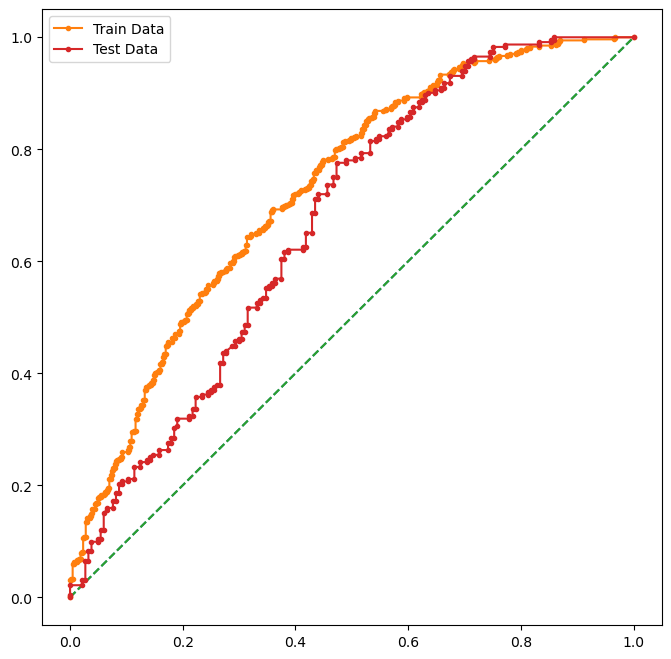

In [123]:
# predict probabilities
probs = best_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC on Train set: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr,marker ='.', label ='Train Data')


# predict probabilities
probs = best_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC on Test set : %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr, marker = '.', label = 'Test Data')
plt.legend(loc = 'best')
plt.show()

### LDA Train and Test set Accuracy, Confusion Matrix, ROC_AUC_Score and ROC Curve

In [124]:
#Plotting confusion matrix for the different models for the Training Data

print('LDA Confusion Matrix on Train Data\n',metrics.confusion_matrix(y_train, lda_ytrain_predict)) 
#Plotting confusion matrix for the different models for the Test Data

print('LDA Confusion Matrix on Test Data \n',metrics.confusion_matrix(y_test, lda_ytest_predict)) 


LDA Confusion Matrix on Train Data
 [[229 201]
 [115 425]]
LDA Confusion Matrix on Test Data 
 [[ 83 101]
 [ 42 190]]


In [125]:
print('LDA Classification report on Train Data \n',metrics.classification_report(y_train, lda_ytrain_predict))
print('LDA Classification report on Test Data \n',metrics.classification_report(y_test, lda_ytest_predict)) 

LDA Classification report on Train Data 
               precision    recall  f1-score   support

           0       0.67      0.53      0.59       430
           1       0.68      0.79      0.73       540

    accuracy                           0.67       970
   macro avg       0.67      0.66      0.66       970
weighted avg       0.67      0.67      0.67       970

LDA Classification report on Test Data 
               precision    recall  f1-score   support

           0       0.66      0.45      0.54       184
           1       0.65      0.82      0.73       232

    accuracy                           0.66       416
   macro avg       0.66      0.64      0.63       416
weighted avg       0.66      0.66      0.64       416



AUC for the Training Data: 0.846
AUC for the Test Data: 0.713


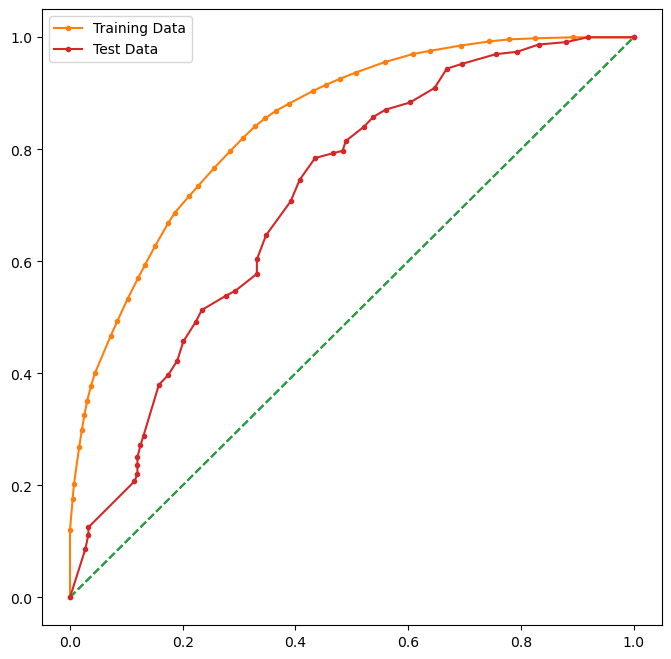

In [126]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(y_train,pred_prob_train[:,1]) 
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(y_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc) 

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

### CART Train and Test set Accuracy, Confusion Matrix, ROC_AUC_Score and ROC Curve

In [127]:
print('CART Confusion Matrix on Train Data \n',confusion_matrix(y_train,cart_ytrain_predict))

CART Confusion Matrix on Train Data 
 [[430   0]
 [ 12 528]]


In [128]:
print('CART Confusion Matrix on Test Data\n',confusion_matrix(y_test,cart_ytest_predict))

CART Confusion Matrix on Test Data
 [[100  84]
 [ 80 152]]


In [129]:
print('Classification Report on Train Data \n',classification_report(y_train,cart_ytrain_predict))

Classification Report on Train Data 
               precision    recall  f1-score   support

           0       0.97      1.00      0.99       430
           1       1.00      0.98      0.99       540

    accuracy                           0.99       970
   macro avg       0.99      0.99      0.99       970
weighted avg       0.99      0.99      0.99       970



In [130]:
print('Clasification Report on Test Data \n',classification_report(y_test,cart_ytest_predict))

Clasification Report on Test Data 
               precision    recall  f1-score   support

           0       0.56      0.54      0.55       184
           1       0.64      0.66      0.65       232

    accuracy                           0.61       416
   macro avg       0.60      0.60      0.60       416
weighted avg       0.60      0.61      0.61       416



AUC: 1.000
AUC: 0.597


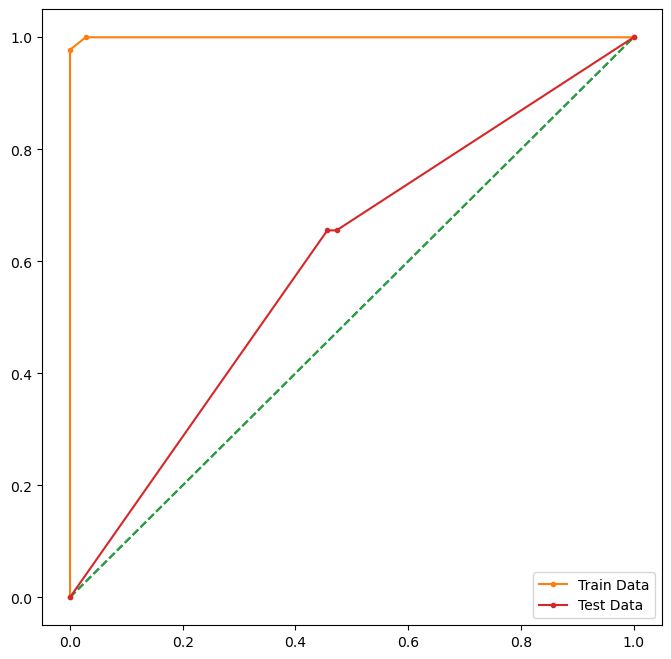

In [131]:
# AUC and ROC for the training data

# predict probabilities
probs = dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Train Data')
# show the plot



# AUC and ROC for the test data


# predict probabilities
probs = dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Test Data')
# show the plot
plt.legend(loc = 'best')
plt.show()


###  Decision Tree using GridsearchCV and Test set Accuracy, Confusion Matrix, ROC_AUC_Score and ROC Curve

In [132]:
from sklearn.metrics import classification_report,confusion_matrix

In [133]:
print('Reg-Decision Tree Confusion Matrix on Train Data \n',confusion_matrix(y_train, regcart_ytrain_predict))

Reg-Decision Tree Confusion Matrix on Train Data 
 [[289 141]
 [ 86 454]]


In [134]:
print('Reg-Decision Tree Confusion Matrix on Test Data \n',confusion_matrix(y_test, regcart_ytest_predict))

Reg-Decision Tree Confusion Matrix on Test Data 
 [[104  80]
 [ 50 182]]


In [135]:
print('Reg-Decision Tree Classification report \n',classification_report(y_train, regcart_ytrain_predict))

Reg-Decision Tree Classification report 
               precision    recall  f1-score   support

           0       0.77      0.67      0.72       430
           1       0.76      0.84      0.80       540

    accuracy                           0.77       970
   macro avg       0.77      0.76      0.76       970
weighted avg       0.77      0.77      0.76       970



In [136]:
print('Reg-Decision Tree Classification Report \n',classification_report(y_test, regcart_ytest_predict))

Reg-Decision Tree Classification Report 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62       184
           1       0.69      0.78      0.74       232

    accuracy                           0.69       416
   macro avg       0.68      0.67      0.68       416
weighted avg       0.69      0.69      0.68       416



AUC: 0.846
AUC: 0.713


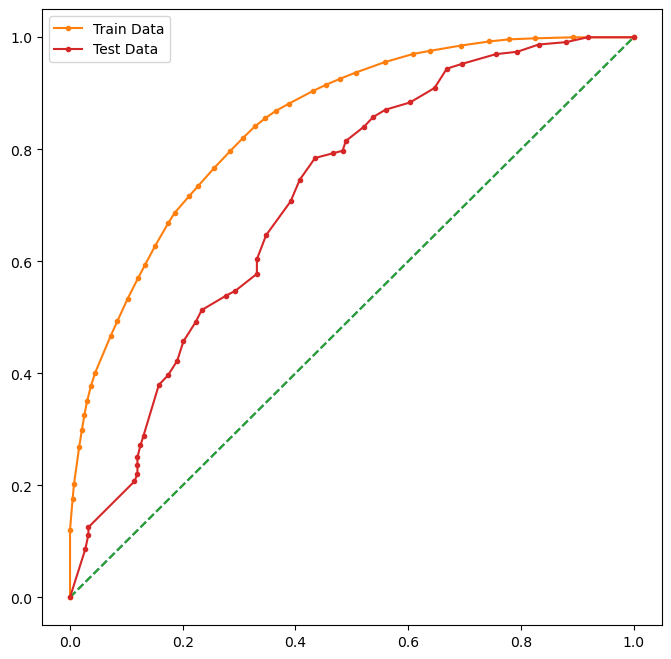

In [137]:
# AUC and ROC for the training data

# predict probabilities
probs = reg_dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Train Data')
# show the plot



# AUC and ROC for the test data


# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Test Data')
# show the plot
plt.legend(loc = 'best')
plt.show()


### Make 3 models using Decision Tree Classifier , Logistic Regression and LDA and comparing the Accuracy to find the best model

* Check Train and Test Accuracy to see that there is huge over/under fitting

In [138]:
from sklearn.metrics import accuracy_score

log = LogisticRegression()
lda = LinearDiscriminantAnalysis()
dtree = DecisionTreeClassifier()

models =[log,lda,dtree]

accuracy_train=[]
accuracy_test=[]
auc_train=[]
auc_test=[]


for i in models:
    i.fit(X_train,y_train)
    probs_train = i.predict_proba(X_train)
    probs_train = probs_train[:,1]
    probs_test = i.predict_proba(X_test)
    probs_test = probs_test[:,1]
    accuracy_train.append(accuracy_score(y_train,i.predict(X_train)))
    accuracy_test.append(accuracy_score(y_test,i.predict(X_test)))
    auc_train.append(roc_auc_score(y_train,probs_train))
    auc_test.append(roc_auc_score(y_test,probs_test))

print(pd.DataFrame({'Train Accuracy':accuracy_train,'Test Accuracy':accuracy_test,'AUC Train Score':auc_train,'AUC Test Score':auc_test},
                  index=['Logistic Regression','LinearDiscriminant','DecisionTreeClassifier']))
    

                        Train Accuracy  Test Accuracy  AUC Train Score  \
Logistic Regression           0.680412       0.656250         0.727472   
LinearDiscriminant            0.674227       0.656250         0.727028   
DecisionTreeClassifier        0.987629       0.610577         0.999690   

                        AUC Test Score  
Logistic Regression           0.670153  
LinearDiscriminant            0.669029  
DecisionTreeClassifier        0.606095  


### Looks like Decision Tree Classifier, is under-fitting because train accuracy > test accuracy ., Let's Grid Search to get the best parameters or prune the tree

### GridSearchCV:

In [139]:
param_grid = {
    'max_depth': [10,15,20,25,30],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [15,30,35,40,50],
    'criterion' :['gini', 'entropy']
}

dtr=tree.DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtr, param_grid = param_grid, cv = 3)


grid_search.fit(X_train,y_train)

print(grid_search.best_params_)

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 15, 'min_samples_split': 15}


In [142]:
grid={'penalty':['l2','none'],
      'solver':['sag','lbfgs'],
      'tol':[0.0001,0.00001]}
model_GR = LogisticRegression(max_iter=10000,n_jobs=2)
grid_search= GridSearchCV(estimator= model_GR, param_grid= grid ,cv =3,n_jobs=-1,scoring='f1')
grid_search.fit(X_train,y_train)
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'sag', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=2, solver='sag')


In [146]:
log = LogisticRegression(max_iter=10000, n_jobs=2, solver='sag')
lda = LinearDiscriminantAnalysis()
dtree = DecisionTreeClassifier(criterion ='gini', max_depth= 10, min_samples_leaf= 15, min_samples_split= 15)

models =[log,lda,dtree]

accuracy_train=[]
accuracy_test=[]
auc_train=[]
auc_test=[]


for i in models:
    i.fit(X_train,y_train)
    probs_train = i.predict_proba(X_train)
    probs_train = probs_train[:,1]
    probs_test = i.predict_proba(X_test)
    probs_test = probs_test[:,1]
    accuracy_train.append(accuracy_score(y_train,i.predict(X_train)))
    accuracy_test.append(accuracy_score(y_test,i.predict(X_test)))
    auc_train.append(roc_auc_score(y_train,probs_train))
    auc_test.append(roc_auc_score(y_test,probs_test))

print(pd.DataFrame({'Train Accuracy':accuracy_train,'Test Accuracy':accuracy_test,'AUC Train Score':auc_train,'AUC Test Score':auc_test},
                  index=['Logistic Regression','LinearDiscriminant','DecisionTreeClassifier']))
    

                        Train Accuracy  Test Accuracy  AUC Train Score  \
Logistic Regression           0.677320       0.661058         0.727394   
LinearDiscriminant            0.674227       0.656250         0.727028   
DecisionTreeClassifier        0.765979       0.687500         0.845967   

                        AUC Test Score  
Logistic Regression           0.669919  
LinearDiscriminant            0.669029  
DecisionTreeClassifier        0.711675  


### Clearly now the underfitting of the model in Decison tree is reduced and Logistic Regression classifier results in the best accuracy score thus this model will be selected for classification

AUC: 0.727
AUC: 0.670


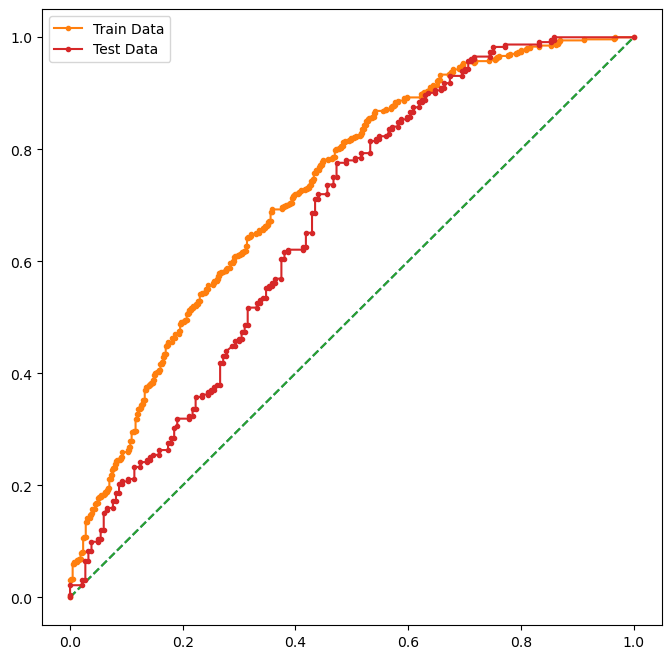

In [152]:
# AUC and ROC for the training data

# predict probabilities
probs = log.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Train Data')
# show the plot



# AUC and ROC for the test data


# predict probabilities
probs = log.predict_proba(X_test) 
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Test Data')
# show the plot
plt.legend(loc = 'best')
plt.show()

In [154]:
print(classification_report(y_train, log.predict(X_train)))#Trainig Classification report 


              precision    recall  f1-score   support

           0       0.66      0.55      0.60       430
           1       0.69      0.78      0.73       540

    accuracy                           0.68       970
   macro avg       0.67      0.66      0.67       970
weighted avg       0.68      0.68      0.67       970



In [155]:
print(classification_report(y_test, log.predict(X_test)))#Test Classification report 

              precision    recall  f1-score   support

           0       0.67      0.47      0.55       184
           1       0.66      0.81      0.73       232

    accuracy                           0.66       416
   macro avg       0.66      0.64      0.64       416
weighted avg       0.66      0.66      0.65       416



**Conclusion**

### 2.4 Inference: Basis on these predictions, what are the insights and recommendations.

### Inference on the data:

* Prediction of label 1: Contraceptive method Not Used
  * Precision is 69% and recall is 78% in the Training set
  * Precision is 66% and recall is 81% in the Testing set
* Prediction of lable 0: Contraceptive method Used
  * Precision is 66% and recall is 55% in the Training set
  * Precision is 67% and recall is 47% in the Testing set

* Though the model performance is poor but out of the Three models Logistic Regression Model is a better model